# How to predict house price?
we will explore predictors and response, we will speak about skewness and transformation like log, box cox or yeo, we will sea feature engineering and modelling with linear regression techniques, bagging, boosting , voting and stacking techniques.
Our work will deliver an acceptable RMSE of 0.125 for the competition.  
no doubt that we can improve by adding models ,features and try .  
But keep in mind that in the real life we want a stable model , which has the capability to generalize and which is interpretable.  
And getting the lowest RMSE for a specific dataset doesn't always respect these constraints

In [1]:
import os
os.listdir('/kaggle/input/house-prices-advanced-regression-techniques/')

['sample_submission.csv', 'data_description.txt', 'train.csv', 'test.csv']

# EDA

/kaggle/working
data availability


<Axes: xlabel='% data availability'>

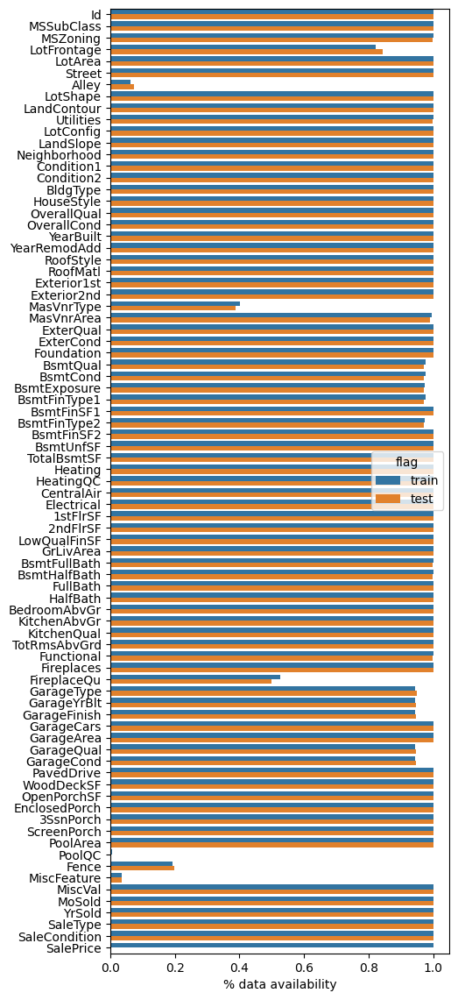

In [2]:
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(5, 14))

print(os.getcwd())

compet = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/sample_submission.csv', delimiter=",")
test = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/test.csv', delimiter=",")
train = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/train.csv', delimiter=",")
full = pd.concat([train, test], axis=0).reset_index(drop=True)

avtr = pd.DataFrame(train.notnull().mean(), columns=['% data availability'])
avtr['flag'] = 'train'
avte = pd.DataFrame(test.notnull().mean(), columns=['% data availability'])
avte['flag'] = 'test'
av = pd.concat([avtr, avte], axis=0)
print('data availability')
sns.barplot(y=av.index, x='% data availability', data=av, hue='flag', ax=ax)

data availability


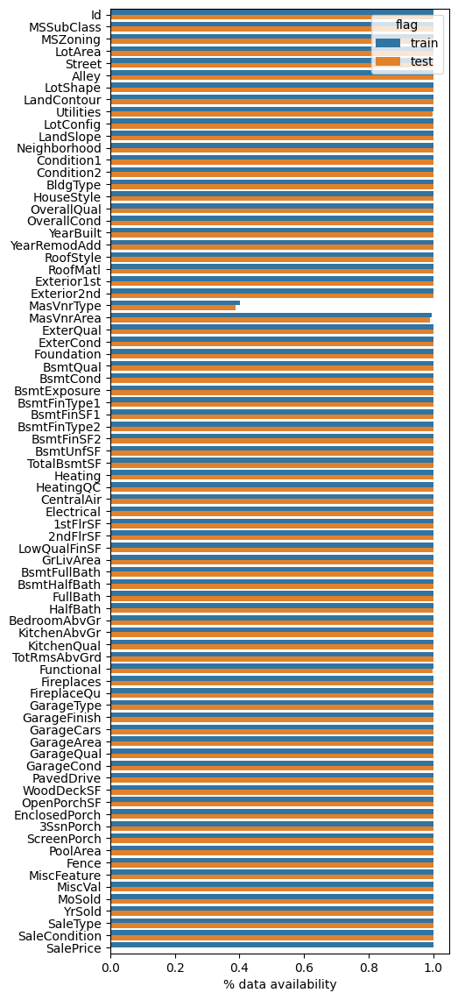

In [3]:
# drop poor columns
lis2drop = ['LotFrontage', 'GarageYrBlt', 'PoolQC']

# nan is not always a missing data
full = full.drop(columns=lis2drop)
full.Alley = full.Alley.fillna('no')
full.FireplaceQu = full.FireplaceQu.fillna('no')
full.GarageType = full.GarageType.fillna('no')
full.GarageFinish = full.GarageFinish.fillna('no')
full.GarageQual = full.GarageQual.fillna('no')
full.GarageCond = full.GarageCond.fillna('no')
full.Fence = full.Fence.fillna('no')
full.MiscFeature = full.MiscFeature.fillna('no')
full.BsmtQual = full.BsmtQual.fillna('no')
full.BsmtCond = full.BsmtCond.fillna('no')
full.BsmtExposure = full.BsmtExposure.fillna('no')
full.BsmtFinType1 = full.BsmtFinType1.fillna('no')
full.BsmtFinType2 = full.BsmtFinType2.fillna('no')
full.Exterior1st = full.Exterior1st.fillna('no')
full.MSZoning = full.MSZoning.fillna('no')
full.KitchenQual = full.KitchenQual.fillna('no')

full.TotalBsmtSF = full.TotalBsmtSF.fillna(0)

full.GarageArea = full.GarageArea.fillna(0)
full.GarageCars = full.GarageCars.fillna(0)
full.BsmtFullBath = full.BsmtFullBath.fillna(0)
full.BsmtHalfBath = full.BsmtHalfBath.fillna(0)
full.FullBath = full.FullBath.fillna(0)
full.HalfBath = full.HalfBath.fillna(0)


# check availability after cleaning
fig, ax = plt.subplots(1, 1, figsize=(5, 14))
avtr = pd.DataFrame(full.loc[full.SalePrice.notnull()].notnull().mean(), columns=[
                    '% data availability'])
avtr['flag'] = 'train'
avte = pd.DataFrame(full.loc[full.SalePrice.isnull()].notnull().mean(), columns=[
                    '% data availability'])
avte['flag'] = 'test'
av = pd.concat([avtr, avte], axis=0)
print('data availability')
sns.barplot(y=av.index, x='% data availability', data=av, hue='flag', ax=ax)

train = full.loc[full.SalePrice.notnull()].copy()
test = full.loc[full.SalePrice.isnull()].copy()

## target analysis and skewness
* Log transformations are often recommended for skewed data
    * https://library.virginia.edu/data/articles/interpreting-log-transformations-in-a-linear-model  
    * has the effect of spreading out clumps of data and bringing together spread-out data
    * If we're performing a statistical analysis that assumes normality, a log transformation might help us meet this assumption
    * help meet the assumption of constant variance in the context of linear modeling


In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats


def add_fit_to_histplot(a, fit=stats.norm, ax=None):

    if ax is None:
        # get the current axes
        ax = plt.gca()

    # compute bandwidth
    bw = len(a)**(-1/5) * a.std(ddof=1)
    # initialize PDF support
    x = np.linspace(a.min()-bw*3, a.max()+bw*3, 200)
    # compute PDF parameters
    params = fit.fit(a)
    # compute PDF values
    y = fit.pdf(x, *params)
    # plot the fitted continuous distribution
    ax.plot(x, y, color='#282828')
    return ax

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64
positive skewed >0 - long right tail:  1.8828757597682129
not skewed after log transformation - symmetric :  0.12133506220520406
lepto kurtic >3 - fat tail:  6.536281860064529
platy kurtic <3 - thin tail after log transformation:  0.8095319958036296


Text(0.5, 1.0, 'prob plot : log(salepr) vs theo norm')

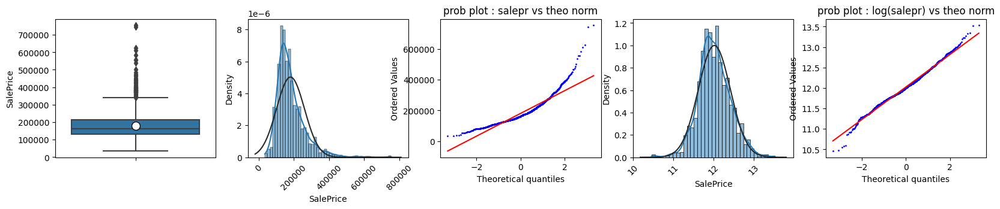

In [5]:
import numpy as np

print(train.SalePrice.describe())
print('positive skewed >0 - long right tail: ', train.SalePrice.skew())
print('not skewed after log transformation - symmetric : ',
      np.log(train.SalePrice).skew())
print('lepto kurtic >3 - fat tail: ', train.SalePrice.kurt())
print('platy kurtic <3 - thin tail after log transformation: ',
      np.log(train.SalePrice).kurt())
fig, ax = plt.subplots(1, 5, figsize=(20, 3))
sns.boxplot(y='SalePrice', data=train, ax=ax[0],
            showmeans=True, meanprops={"marker": "o", "markerfacecolor": "white", "markeredgecolor": "black", "markersize": "10"})
sns.histplot(train['SalePrice'], ax=ax[1], kde=True, stat="density")
add_fit_to_histplot(train['SalePrice'], fit=stats.norm, ax=ax[1])
ax[1].tick_params(axis='x', rotation=45)
stats.probplot(train['SalePrice'], plot=ax[2])
ax[2].get_lines()[0].set_markersize(1.0)
ax[2].set_title('prob plot : salepr vs theo norm')
sns.histplot(np.log(train['SalePrice']), ax=ax[3], kde=True, stat="density")
add_fit_to_histplot(np.log(train['SalePrice']), fit=stats.norm, ax=ax[3])
ax[3].tick_params(axis='x', rotation=45)
stats.probplot(np.log(train['SalePrice']), plot=ax[4])
ax[4].get_lines()[0].set_markersize(1.0)
ax[4].set_title('prob plot : log(salepr) vs theo norm')

In [6]:
from scipy import stats
IQR = stats.iqr(train['SalePrice'], interpolation='midpoint')
print(IQR)
print(train.shape)
train2 = train.loc[(train.SalePrice > (np.percentile(train['SalePrice'], 25)-1.5*IQR))
                   & (train.SalePrice < (np.percentile(train['SalePrice'], 75)+1.5*IQR)), ].copy()
print(train2.shape)

84050.0
(1460, 78)
(1399, 78)


count      1399.000000
mean     170237.127234
std       59230.130817
min       34900.000000
25%      129000.000000
50%      159500.000000
75%      203500.000000
max      340000.000000
Name: SalePrice, dtype: float64
positive skewed >0 - long right tail:  0.6797386630838265
not skewed after log transformation - symmetric :  -0.33258581776907303
lepto kurtic >3 - fat tail:  0.09092713602572067
platy kurtic <3 - thin tail after log transformation:  0.5795698249935302


Text(0.5, 1.0, 'prob plot : log(salepr) vs theo norm')

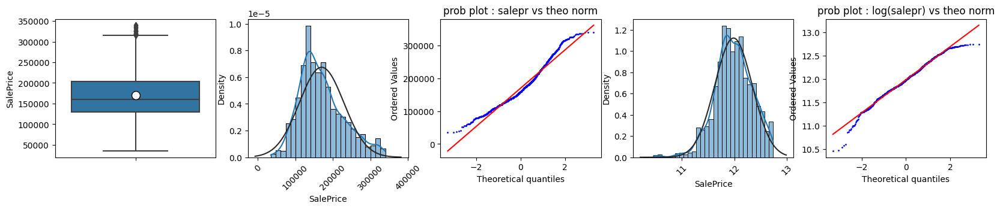

In [7]:
import numpy as np

print(train2.SalePrice.describe())
print('positive skewed >0 - long right tail: ', train2.SalePrice.skew())
print('not skewed after log transformation - symmetric : ',
      np.log(train2.SalePrice).skew())
print('lepto kurtic >3 - fat tail: ', train2.SalePrice.kurt())
print('platy kurtic <3 - thin tail after log transformation: ',
      np.log(train2.SalePrice).kurt())
fig, ax = plt.subplots(1, 5, figsize=(20, 3))
sns.boxplot(y='SalePrice', data=train2, ax=ax[0],
            showmeans=True, meanprops={"marker": "o", "markerfacecolor": "white", "markeredgecolor": "black", "markersize": "10"})
sns.histplot(train2['SalePrice'], ax=ax[1], kde=True, stat="density")
add_fit_to_histplot(train2['SalePrice'], fit=stats.norm, ax=ax[1])
ax[1].tick_params(axis='x', rotation=45)
stats.probplot(train2['SalePrice'], plot=ax[2])
ax[2].get_lines()[0].set_markersize(1.0)
ax[2].set_title('prob plot : salepr vs theo norm')
sns.histplot(np.log(train2['SalePrice']), ax=ax[3], kde=True, stat="density")
add_fit_to_histplot(np.log(train2['SalePrice']), fit=stats.norm, ax=ax[3])
ax[3].tick_params(axis='x', rotation=45)
stats.probplot(np.log(train2['SalePrice']), plot=ax[4])
ax[4].get_lines()[0].set_markersize(1.0)
ax[4].set_title('prob plot : log(salepr) vs theo norm')

## Categorial features

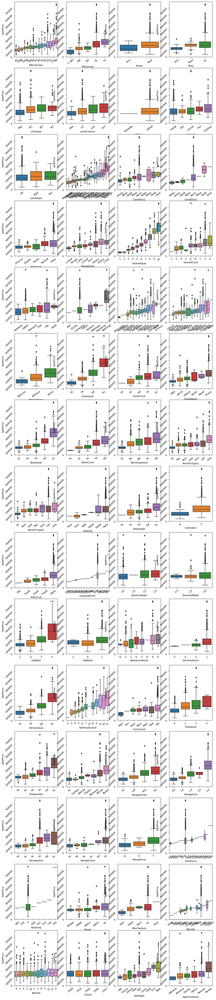

In [8]:
import math
h = pd.DataFrame(train.nunique(), columns=['nb'])
lis = h[h.nb < 26].index.to_list()


height = 5*(math.ceil(len(lis)/4))
plt.rcParams["figure.figsize"] = [15, height]
f, ax = plt.subplots(math.ceil(len(lis)/4), 4)


k = 0
l = 0
for i, j in enumerate(lis):
    try:
        sns.boxplot(data=train,
                    y="SalePrice", x=j, order=train.groupby(j).SalePrice.mean().sort_values().index, ax=ax[k][l])
        ax[k][l].tick_params(axis='x', rotation=35)
        ax[k][l].tick_params(axis='y', rotation=45)
        k = int((i+1)/4)
        l = (i+1) % 4
    except:
        print('error with:', j)

## Continued features

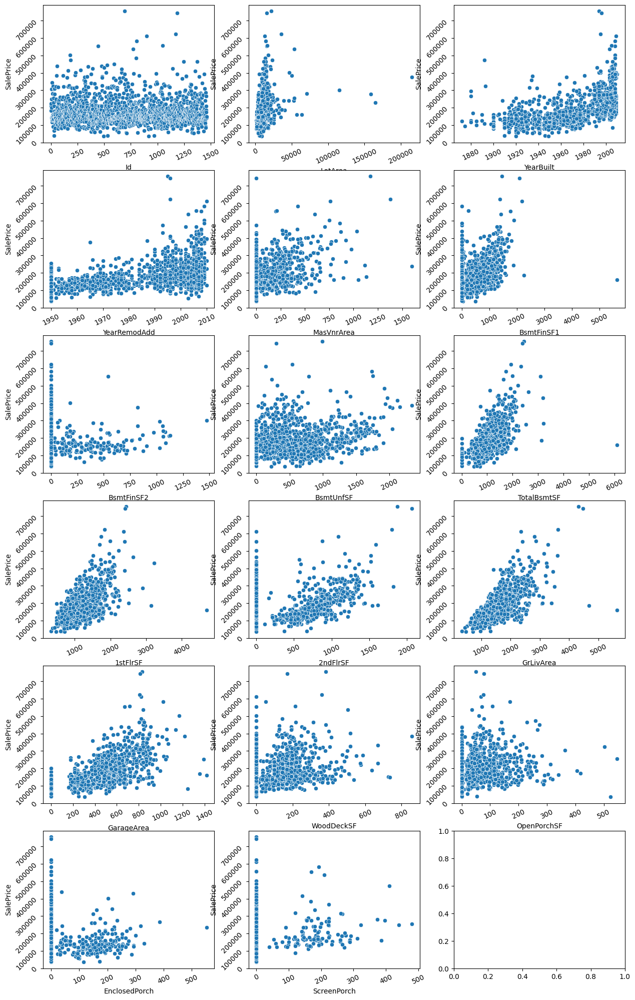

In [9]:
import math
lis = h[h.nb >= 26].index.to_list()
lis.remove('SalePrice')

height = 4*(math.ceil(len(lis)/3))+1
plt.rcParams["figure.figsize"] = [15, height]
f, ax = plt.subplots(math.ceil(len(lis)/3), 3)


k = 0
l = 0
for i, j in enumerate(lis):
    try:
        sns.scatterplot(data=train,
                        y="SalePrice", x=j, ax=ax[k][l])
        ax[k][l].tick_params(axis='x', rotation=25)
        ax[k][l].tick_params(axis='y', rotation=45)
        k = int((i+1)/3)
        l = (i+1) % 3
    except:
        print('error with:', j)

In [10]:
# oblige de transformer les chiffres en string pour utiliser l ordre dans l encodeur
dic_MSSubClass = {
    20:	'1st >war',
    30:	'1st <war',
    40:	'1st fin attic',
    45:	'1.5st unfin',
    50:	'1.5st fin',
    60:	'2st >war',
    70:	'2st <war',
    75:	'2.5st',
    80:	'multi',
    85:	'split',
    90:	'duplex',
    120: '1st pud',
    150: '1.5st pud',
    160: '2st pud',
    180: 'multi or split pud',
    190: '2fam conv'}

train['MSSubClass'] = train['MSSubClass'].map(dic_MSSubClass)

In [11]:
# #train['LowQualFinSF'].value_counts()
# train['BsmtFullBath'].value_counts()
# train['BsmtHalfBath'].value_counts()
# train['FullBath'].value_counts()
# train['HalfBath'].value_counts()
# train['BedroomAbvGr'].value_counts()
# train['KitchenAbvGr'].value_counts()
# train['TotRmsAbvGrd'].value_counts()
# train['Fireplaces'].value_counts()
# train['GarageCars'].value_counts()
# #train['3SsnPorch'].value_counts()
# #train['PoolArea'].value_counts()
# #train['MiscVal'].value_counts()
# #train['MoSold'].value_counts()
# train['YrSold'].value_counts()

# train['LotFrontage'].value_counts(dropna=False)  # 259na
# train['LotArea'].value_counts(dropna=False)
# train['YearBuilt'].value_counts(dropna=False)
# train['YearRemodAdd'].value_counts(dropna=False)
# #train['MasVnrArea'].value_counts(dropna=False) #861 0 et 8 na

# train['BsmtFinSF1'].value_counts(dropna=False) #467 0
# train['BsmtFinSF2'].value_counts(dropna=False) #1293 0
# train['BsmtUnfSF'].value_counts(dropna=False) #118 0
# train['TotalBsmtSF'].value_counts(dropna=False) #37 0

# train['1stFlrSF'].value_counts(dropna=False)

# train['2ndFlrSF'].value_counts(dropna=False) #829 0

# train['GrLivArea'].value_counts(dropna=False)

# train['GarageYrBlt'].value_counts(dropna=False) #81na
# train['GarageArea'].value_counts(dropna=False) #81na

# train['WoodDeckSF'].value_counts(dropna=False)  # terrasse #761 0
# train['OpenPorchSF'].value_counts(dropna=False) # 656 0
# train['EnclosedPorch'].value_counts(dropna=False) # 1252 0
# train['ScreenPorch'].value_counts(dropna=False) #1344 0
# train['SalePrice'].value_counts(dropna=False)
# train['SalePrice_sqf'].value_counts(dropna=False)

## Correlation and clustering

In [12]:
import numpy as np
h = pd.DataFrame(train.nunique(), columns=['nb'])
lis = h[h.nb < 26].index.to_list()

categ = []
lisfilt = []
lisfiltint = []
for i, j in enumerate(lis):
    ordi = []
    try:
        if train.groupby(j).SalePrice.mean().sort_values().index.dtype == 'object':
            lisfilt.append(j)
            ordi = train.groupby(j).SalePrice.mean(
            ).sort_values().index.to_list()
            ordi.insert(0, np.nan)
            categ.append(ordi)
            # print(ordi,train.groupby(j).SalePrice.mean().sort_values().index.dtype)
        else:
            lisfiltint.append(j)

    except:
        print('error with:', j)

In [13]:
from sklearn.preprocessing import OrdinalEncoder

ordenc = OrdinalEncoder(categories=categ)
train_enc = pd.DataFrame(ordenc.fit_transform(
    train[lisfilt]), columns=lisfilt)
train_enc = train_enc.fillna(-1)

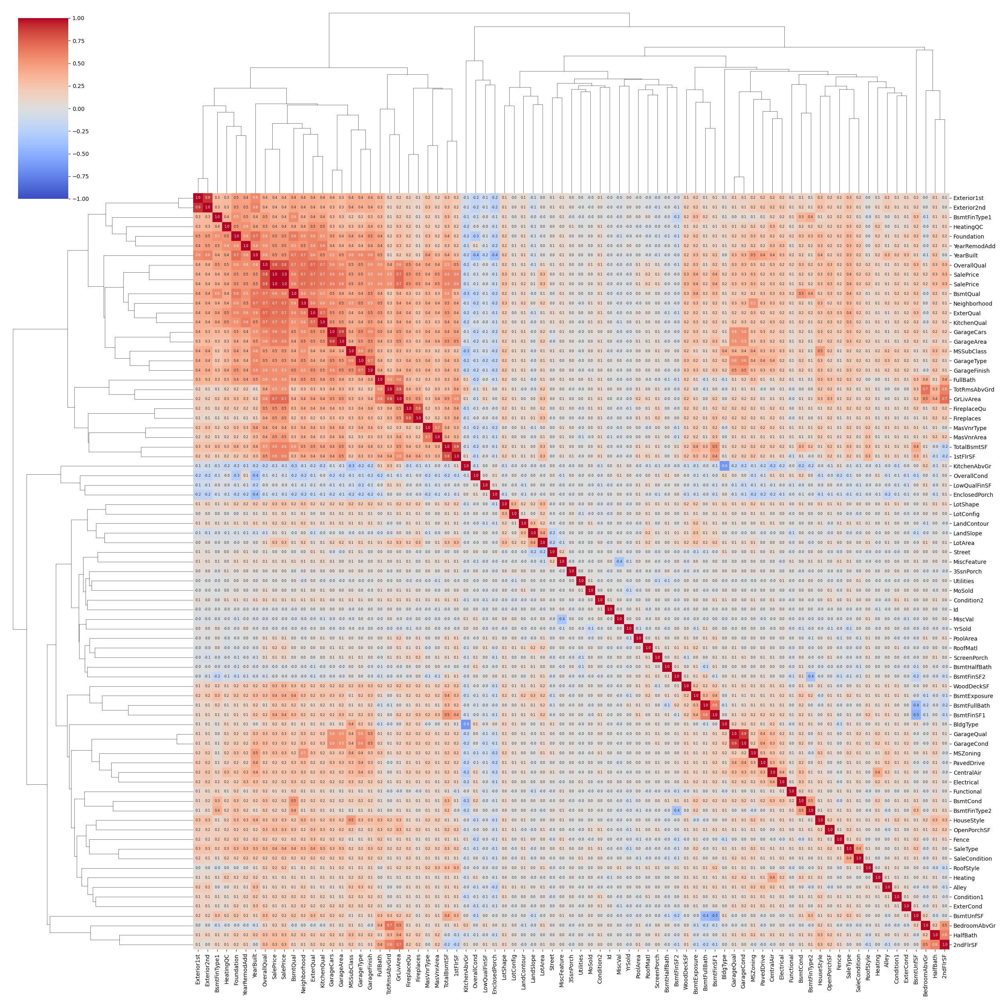

In [14]:
h = pd.DataFrame(train.nunique(), columns=['nb'])

sns.clustermap(pd.concat([train.SalePrice, train_enc, train[lisfiltint], train[h[h.nb >= 26].index.to_list()]], axis=1).corr(), cmap='coolwarm', annot=True,
               annot_kws={"size": 6}, vmin=-1, vmax=1, figsize=(25, 25), fmt='.1f')

# Feature engineering
* Normalisation in terms of skewness
    * log : only > 0
    * box cox : only > 0 ; Lamba=0 -> log
    * yeo ; Lamba=0 -> log

In [15]:
from sklearn.preprocessing import PowerTransformer


def translog_vis(data, var, target, ln=True, light=False):

    if light == False:

        fig, ax = plt.subplots(1, 6, figsize=(20, 3))
        sns.boxplot(y=var, data=data, ax=ax[0],
                    showmeans=True, meanprops={"marker": "o", "markerfacecolor": "white", "markeredgecolor": "black", "markersize": "10"})

        sns.histplot(data[var], ax=ax[1], kde=True, stat="density")
        add_fit_to_histplot(data[var], fit=stats.norm, ax=ax[1])
        ax[1].tick_params(axis='x', rotation=45)

        stats.probplot(data[var], plot=ax[2])
        ax[2].get_lines()[0].set_markersize(1.0)
        ax[2].set_title('prob plot :' + str(var))

    # yeo transform for normalisation in terms of skewness
        pt = PowerTransformer()

        df = data[[target, var]].copy()
        df1 = np.log(df+1)
        df2 = pd.DataFrame(pt.fit_transform(df))

        df1.columns = ['log'+str(target), 'log'+str(var)]
        df2.columns = ['yeo'+str(target), 'yeo'+str(var)]
        df = pd.concat([df, df1, df2], axis=1)

        sns.regplot(data=df,
                    y='log'+str(target), x=var, ax=ax[3], line_kws={"color": "red"}, ci=99, scatter_kws={'s': 3})
        ax[3].tick_params(axis='x', rotation=25)
        ax[3].tick_params(axis='y', rotation=45)
        ax[3].set_title('log'+str(target)+' vs '+str(var))

        sns.regplot(data=df,
                    y='yeo'+str(target), x=var, ax=ax[4], line_kws={"color": "red"}, ci=99, scatter_kws={'s': 3})
        ax[4].tick_params(axis='x', rotation=25)
        ax[4].tick_params(axis='y', rotation=45)
        ax[4].set_title('yeo'+str(target)+' vs '+str(var))

    elif light == True:
        fig, ax = plt.subplots(1, 4, figsize=(14, 3))
        sns.boxplot(y=var, data=data, ax=ax[0],
                    showmeans=True, meanprops={"marker": "o", "markerfacecolor": "white", "markeredgecolor": "black", "markersize": "10"})

        sns.histplot(data[var], ax=ax[1], kde=True, stat="density")
        add_fit_to_histplot(data[var], fit=stats.norm, ax=ax[1])
        ax[1].tick_params(axis='x', rotation=45)

        stats.probplot(data[var], plot=ax[2])
        ax[2].get_lines()[0].set_markersize(1.0)
        ax[2].set_title('prob plot :' + str(var))

        df = data[[target, var]].copy()

        sns.regplot(data=df,
                    y=str(target), x=var, ax=ax[3], line_kws={"color": "red"}, ci=99, scatter_kws={'s': 3})
        ax[3].tick_params(axis='x', rotation=25)
        ax[3].tick_params(axis='y', rotation=45)
        ax[3].set_title(str(target)+' vs '+str(var))

    if ln == True:
        print('lambda yeo'+str(target) + 'yeo'+str(var), pt.lambdas_)
        fig, ax = plt.subplots(1, 6, figsize=(20, 3))

        sns.histplot(df['log'+str(var)], ax=ax[0], kde=True, stat="density")
        add_fit_to_histplot(df['log'+str(var)], fit=stats.norm, ax=ax[0])
        ax[0].tick_params(axis='x', rotation=45)

        sns.histplot(df['yeo'+str(var)], ax=ax[1], kde=True, stat="density")
        add_fit_to_histplot(df['yeo'+str(var)], fit=stats.norm, ax=ax[1])
        ax[1].tick_params(axis='x', rotation=45)

        stats.probplot(df['log'+str(var)], plot=ax[2])
        ax[2].get_lines()[0].set_markersize(1.0)
        ax[2].set_title('prob plot : log '+str(var))

        stats.probplot(df['yeo'+str(var)], plot=ax[3])
        ax[3].get_lines()[0].set_markersize(1.0)
        ax[3].set_title('prob plot : yeo '+str(var))

        sns.regplot(data=df,
                    y='log'+str(target), x='log'+str(var), ax=ax[4], line_kws={"color": "red"}, ci=99, scatter_kws={'s': 3})
        ax[4].tick_params(axis='x', rotation=25)
        ax[4].tick_params(axis='y', rotation=45)
        ax[4].set_title('log '+str(target) + ' vs log'+str(var))

        sns.regplot(data=df,
                    y='yeo'+str(target), x='yeo'+str(var), ax=ax[5], line_kws={"color": "red"}, ci=99, scatter_kws={'s': 3})
        ax[5].tick_params(axis='x', rotation=25)
        ax[5].tick_params(axis='y', rotation=45)
        ax[5].set_title('yeo '+str(target) + ' vs yeo'+str(var))

In [16]:
############################
full['TotalSF'] = full['TotalBsmtSF'] + full["GrLivArea"]
full['FlrSF'] = full['1stFlrSF'] + full['2ndFlrSF']
full['TotRmsAbvGrd_'] = full['TotRmsAbvGrd']
full['Fireplaces_'] = full['Fireplaces']+1
full['GarageCars_'] = full['GarageCars']+1
full.loc[full['GarageCars_'] >= 4, ['GarageCars_']] = 4


############################
dic2Neighbor1 = train.groupby(
    'Neighborhood').SalePrice.median().sort_values().to_dict()
dic2Neighbor2 = train.groupby(
    'Neighborhood').SalePrice.mean().sort_values().to_dict()
############################
dic2exq = {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1}
dic2heat1 = {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1}
dic2heat2 = {'Ex': 3, 'Gd': 2, 'TA': 2, 'Fa': 1, 'Po': 1}
dic2bath = {4: 3, 3: 3, 2: 2, 1: 1, 0: 1}
dic2kitch = {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'no': 1}
dic2fire = {'Ex': 6, 'Gd': 5, 'TA': 4, 'Fa': 3, 'Po': 2, 'no': 1}
dic2GarageFinish = {'Fin': 4, 'RFn': 3, 'Unf': 2, 'no': 1}
dic2GarageQual = {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'no': 1}
dic2PavedDrive = {'Y': 3, 'P': 2, 'N': 1}
dic2MSZoning = {'FV': 4, 'RL': 3, 'RM': 2, 'RH': 2, 'C (all)': 1, 'no': 1}
dic2LandContour = {'HLS': 4, 'Low': 3, 'Lvl': 2, 'Bnk': 1}
dic2Condition1 = {'PosA': 3, 'PosN': 3, 'RRNn': 3, 'RRNe': 2,
                  'Norm': 2, 'RRAn': 2, 'Feedr': 1, 'RRAe': 1, 'Artery': 1}
dic2Condition1 = {'PosA': 3, 'PosN': 3, 'RRNn': 3, 'RRNe': 2,
                  'Norm': 2, 'RRAn': 2, 'Feedr': 1, 'RRAe': 1, 'Artery': 1}
dic2BldgType = {'TwnhsE': 4, '1Fam': 3, 'Twnhs': 2, 'Duplex': 2, '2fmCon': 1}
dic2HouseStyle = {'2.5Fin': 6, '2Story': 5, 'SLvl': 4,
                  '1Story': 3, 'SFoyer': 2, '2.5Unf': 2, '1.5Fin': 2, '1.5Unf': 1}
dic2Exterior1st = {'ImStucc': 4, 'Stone': 4, 'CemntBd': 4, 'VinylSd': 4, 'BrkFace': 3,
                   'Plywood': 3, 'HdBoard': 3, 'Stucco': 3, 'WdShing': 2, 'Wd Sdng': 2,
                   'MetalSd': 2, 'AsbShng': 1, 'CBlock': 1, 'AsphShn': 1, 'BrkComm': 1, 'no': 1}
dic2GarageType = {'BuiltIn': 4, 'Attchd': 3, '2Types': 3,
                  'Basment': 2, 'Detchd': 2, 'CarPort': 1, 'no': 1}
dic2CentralAir = {'Y': 2, 'N': 1}
dic2RoofStyle = {'Hip': 3, 'Shed': 3, 'Flat': 2,
                 'Mansard': 2, 'Gable': 2, 'Gambrel': 1}
dic2MasVnrType = {'Stone': 3, np.nan: 2, 'BrkFace': 2,
                  'None': 1, 'BrkCmn': 1}
dic2Foundation = {'PConc': 4, 'Wood': 3, 'CBlock': 3,
                  'Stone': 2, 'BrkTil': 2, 'Slab': 1}
dic2Bsmt = {'Ex': 6, 'Gd': 5, 'TA': 4, 'Fa': 3, 'Po': 2, 'no': 3}
dic2Bsmtex = {'Gd': 3, 'Av': 2, 'Mn': 2, 'No': 2, 'no': 1}
dic2BsmtFinType1 = {'GLQ': 4, 'Unf': 4, 'ALQ': 3,
                    'Rec': 2, 'BLQ': 2, 'LwQ': 2, 'no': 1}
dic2SaleCond = {"Abnorml": 0, "Alloca": 0, "AdjLand": 0,
                "Family": 0, "Normal": 0, "Partial": 1}
#################################################################

full['ExterQual_'] = full['ExterQual'].map(dic2exq)
full['HeatingQC_1'] = full['HeatingQC'].map(dic2heat1)
full['HeatingQC_2'] = full['HeatingQC'].map(dic2heat2)
full['FullBath_'] = full['FullBath'].map(dic2bath)
full['KitchenQual_'] = full['KitchenQual'].map(dic2kitch)
full['FireplaceQu_'] = full['FireplaceQu'].map(dic2fire)
full['GarageFinish_'] = full['GarageFinish'].map(dic2GarageFinish)
full['GarageQual_'] = full['GarageQual'].map(dic2GarageQual)
full['PavedDrive_'] = full['PavedDrive'].map(dic2PavedDrive)
full['MSZoning_'] = full['MSZoning'].map(dic2MSZoning)
full['LandContour_'] = full['LandContour'].map(dic2LandContour)
full['Neighborhood_1'] = full['Neighborhood'].map(dic2Neighbor1)
full['Neighborhood_2'] = full['Neighborhood'].map(dic2Neighbor2)
full['Condition1_'] = full['Condition1'].map(dic2Condition1)
full['BldgType_'] = full['BldgType'].map(dic2BldgType)
full['HouseStyle_'] = full['HouseStyle'].map(dic2HouseStyle)
full['RoofStyle_'] = full['RoofStyle'].map(dic2RoofStyle)
full['Exterior1st_'] = full['Exterior1st'].map(dic2Exterior1st)
full['MasVnrType_'] = full['MasVnrType'].map(dic2MasVnrType)
full['Foundation_'] = full['Foundation'].map(dic2Foundation)
full['BsmtQual_'] = full['BsmtQual'].map(dic2Bsmt)
full['BsmtCond_'] = full['BsmtCond'].map(dic2Bsmt)
full['BsmtExposure_'] = full['BsmtExposure'].map(dic2Bsmtex)
full['BsmtFinType1_'] = full['BsmtFinType1'].map(dic2BsmtFinType1)
full['GarageType_'] = full['GarageType'].map(dic2GarageType)
full['SaleCondition_'] = full.SaleCondition.replace({"Abnorml": 0, "Alloca": 0, "AdjLand": 0,
                                                     "Family": 0, "Normal": 0, "Partial": 1})

# bin
full['CentralAir_'] = full['CentralAir'].map(dic2CentralAir)

#####################
full["TotalBath_"] = full["BsmtFullBath"] + (0.5 * full["BsmtHalfBath"]) + \
    full["FullBath"] + (0.5 * full["HalfBath"])
full["OverallGrade_"] = full["OverallQual"] * full["OverallCond"]
full["SimplFireplaceScore_"] = full["Fireplaces_"] * full["FireplaceQu_"]

## Visualisation

lambda yeoSalePriceyeoGrLivArea [-0.0769321   0.00553964]
lambda yeoSalePriceyeoTotalBsmtSF [-0.0769321   0.73960169]
lambda yeoSalePriceyeo1stFlrSF [-0.0769321 -0.0798771]
lambda yeoSalePriceyeoTotalSF [-0.0769321   0.21721557]
lambda yeoSalePriceyeoFlrSF [-0.0769321   0.03066271]
lambda yeoSalePriceyeo2ndFlrSF [-0.0769321 -0.1274173]
lambda yeoSalePriceyeoGarageArea [-0.0769321   0.81125802]
lambda yeoSalePriceyeoWoodDeckSF [-0.0769321  -0.07859612]
lambda yeoSalePriceyeoYearBuilt [-0.0769321  22.12743659]


/opt/conda/lib/python3.10/site-packages/numpy/core/_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


lambda yeoSalePriceyeoYearRemodAdd [-0.0769321 40.5883864]


/tmp/ipykernel_18/129460918.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 6, figsize=(20, 3))


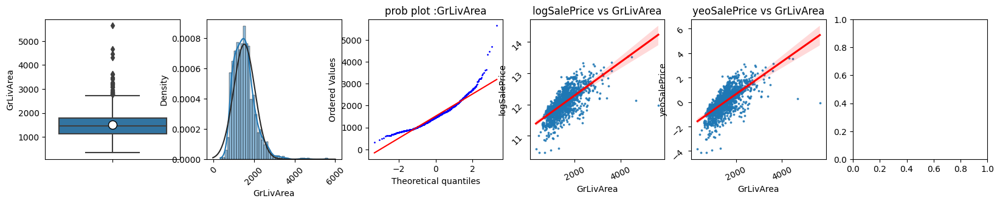

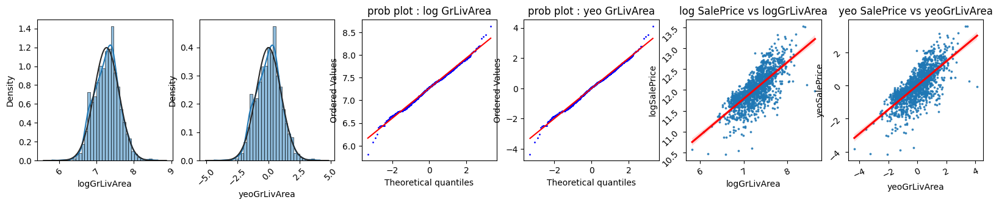

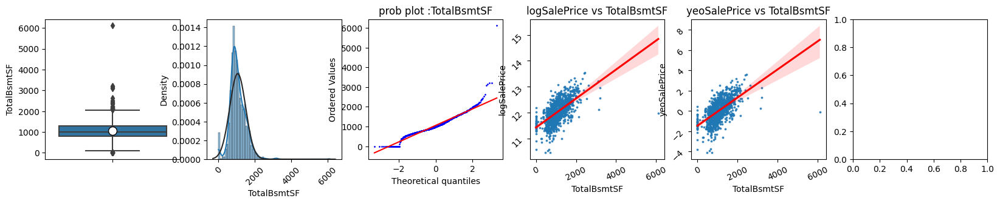

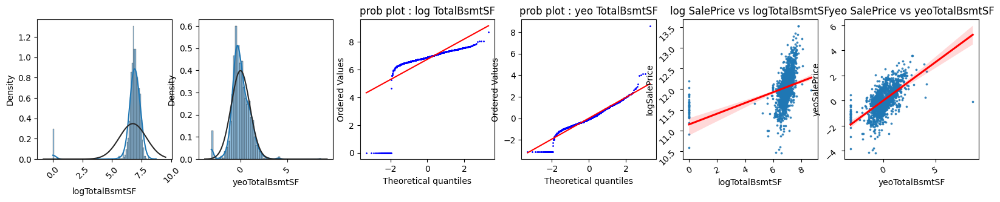

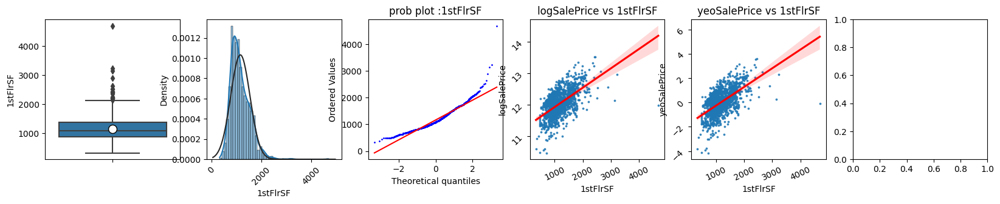

...

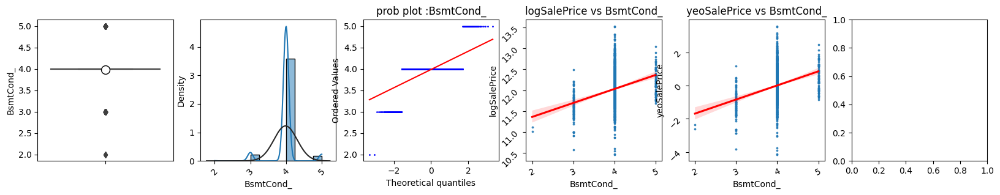

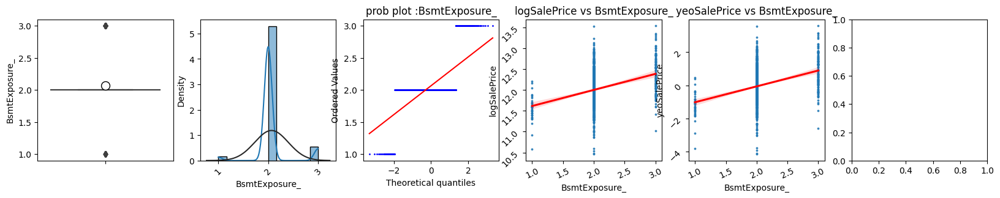

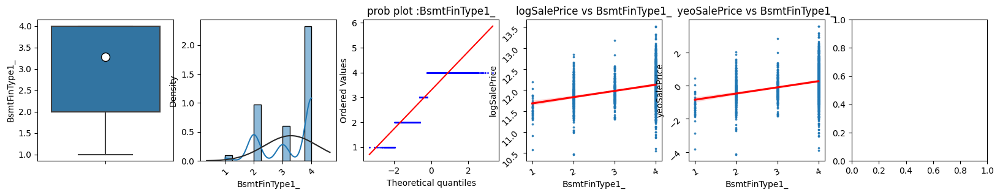

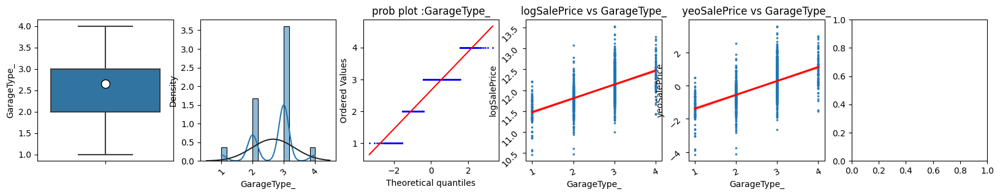

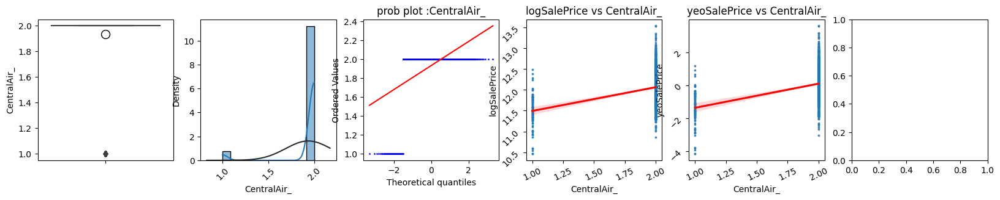

In [17]:
############################
# take care linear relation
translog_vis(full.loc[full.SalePrice.notnull()],
             'GrLivArea', 'SalePrice')  # ok
translog_vis(full.loc[full.SalePrice.notnull()],
             'TotalBsmtSF', 'SalePrice')  # ok
translog_vis(full.loc[full.SalePrice.notnull()], '1stFlrSF', 'SalePrice')  # ok
translog_vis(full.loc[full.SalePrice.notnull()], 'TotalSF', 'SalePrice')  # ok
translog_vis(full.loc[full.SalePrice.notnull()], 'FlrSF', 'SalePrice')  # ok

# too sparse à retraiter ou a utiliser avec des arbres
translog_vis(full.loc[full.SalePrice.notnull()], '2ndFlrSF', 'SalePrice')
translog_vis(full.loc[full.SalePrice.notnull()], 'GarageArea', 'SalePrice')
translog_vis(full.loc[full.SalePrice.notnull()], 'WoodDeckSF', 'SalePrice')

# not interesting
translog_vis(full.loc[full.SalePrice.notnull()], 'YearBuilt', 'SalePrice')
translog_vis(full.loc[full.SalePrice.notnull()], 'YearRemodAdd', 'SalePrice')

translog_vis(full.loc[full.SalePrice.notnull()],
             "TotalBath_", 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             "OverallGrade_", 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             "SimplFireplaceScore_", 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             "SaleCondition_", 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'OverallQual', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'ExterQual_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'HeatingQC_1', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'HeatingQC_2', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'FullBath_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'KitchenQual_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'TotRmsAbvGrd_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'Fireplaces_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'FireplaceQu_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'GarageFinish_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'GarageCars_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'GarageQual_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'PavedDrive_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'MSZoning_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'LandContour_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'Neighborhood_1', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'Neighborhood_2', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'Condition1_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'BldgType_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'HouseStyle_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'RoofStyle_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'Exterior1st_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'MasVnrType_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'Foundation_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'BsmtQual_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'BsmtCond_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'BsmtExposure_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'BsmtFinType1_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'GarageType_', 'SalePrice', ln=False)
translog_vis(full.loc[full.SalePrice.notnull()],
             'CentralAir_', 'SalePrice', ln=False)

In [18]:
print(full.loc[full.SalePrice.notnull()].CentralAir.value_counts(
    normalize=True, dropna=False))
full.loc[full.SalePrice.notnull()].groupby(
    'CentralAir', dropna=False).SalePrice.median().sort_values()

CentralAir
Y    0.934932
N    0.065068
Name: proportion, dtype: float64


CentralAir
N     98000.0
Y    168000.0
Name: SalePrice, dtype: float64

## Correlation and features selection

correlation vs log SalePrice


SalePrice               1.000000
OverallQual             0.817184
TotalSF                 0.805792
Neighborhood_2          0.739375
Neighborhood_1          0.738394
FlrSF                   0.737131
GrLivArea               0.730279
GarageCars_             0.686674
ExterQual_              0.678840
TotalBath_              0.673011
KitchenQual_            0.667893
BsmtQual_               0.665829
GarageArea              0.650888
1stFlrSF                0.608315
OverallGrade_           0.606873
GarageFinish_           0.604878
FullBath_               0.602009
YearBuilt               0.586570
GarageType_             0.568770
FireplaceQu_            0.546362
SimplFireplaceScore_    0.540936
TotRmsAbvGrd_           0.534422
Foundation_             0.528133
Fireplaces_             0.489449
HeatingQC_1             0.473762
HeatingQC_2             0.473587
Exterior1st_            0.411567
MSZoning_               0.403411
GarageQual_             0.367842
CentralAir_             0.351600
BsmtFinTyp

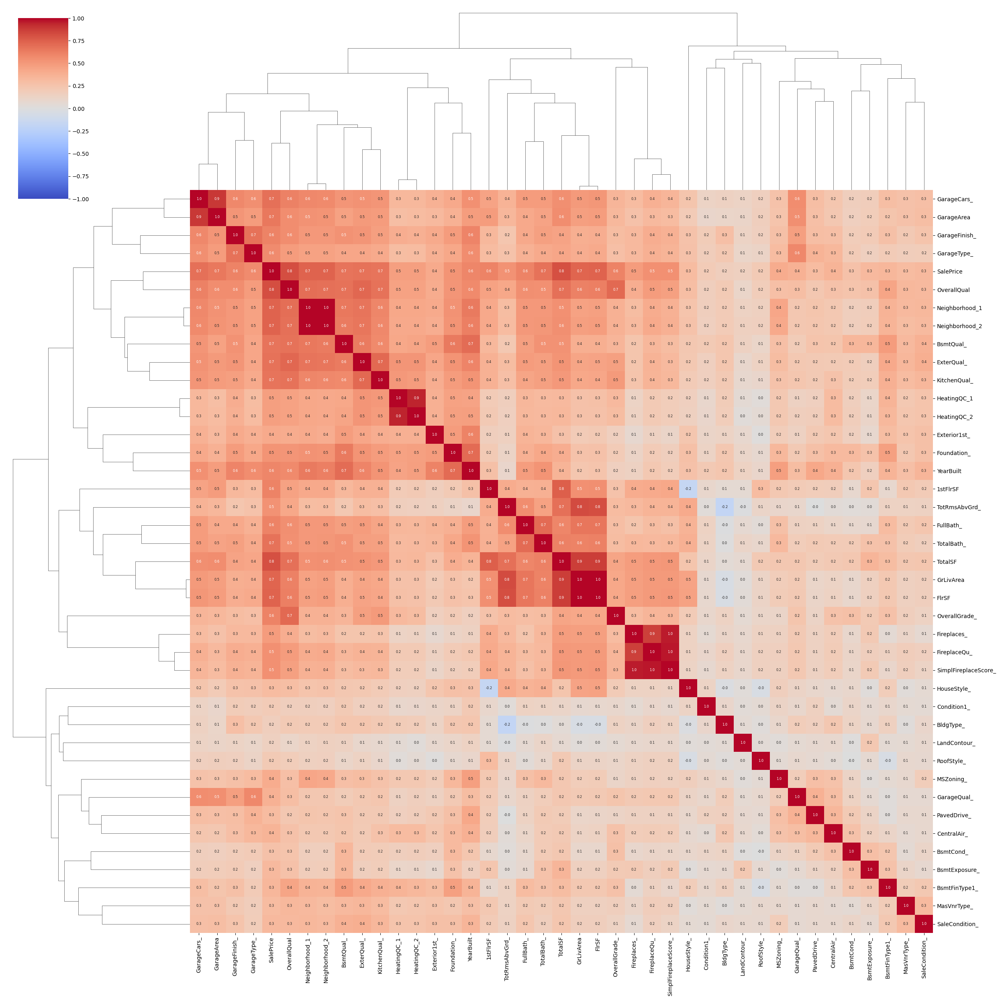

In [19]:
pt = PowerTransformer().set_output(transform="pandas")
h = pt.fit_transform(
    full[['GrLivArea', '1stFlrSF', 'FlrSF', 'TotalSF']])
h = pd.concat([np.log(full['SalePrice']), h, full[['OverallQual', 'ExterQual_', 'HeatingQC_1', 'HeatingQC_2', 'FullBath_',
                                                  'KitchenQual_', 'TotRmsAbvGrd_', 'Fireplaces_', 'FireplaceQu_', 'GarageFinish_',
                                                   'GarageCars_', 'GarageQual_', 'PavedDrive_', 'MSZoning_', 'LandContour_', 'Neighborhood_1',
                                                   'Neighborhood_2', 'Condition1_', 'BldgType_', 'HouseStyle_', 'RoofStyle_',
                                                   'Exterior1st_', 'MasVnrType_', 'Foundation_', 'BsmtQual_',
                                                   'BsmtCond_', 'BsmtExposure_', 'BsmtFinType1_', 'GarageType_', 'CentralAir_',
                                                   'YearBuilt', 'GarageArea', "TotalBath_", "OverallGrade_", "SimplFireplaceScore_", "SaleCondition_"]]], axis=1)
sns.clustermap(h.loc[h.SalePrice.notnull()].corr(), cmap='coolwarm', annot=True,
               annot_kws={"size": 6}, vmin=-1, vmax=1, figsize=(25, 25), fmt='.1f')
print('correlation vs log SalePrice')
h.loc[h.SalePrice.notnull()].corr()['SalePrice'].sort_values(ascending=False)

# Modelling

## Linear regression
what do we want?  
* Normality: 
    * univariate normality doesn't ensure multivariate normality (which is what we would like to have), but it helps
    * in big samples (>200 observations) normality is not such an issue. 
    * However, if we solve normality, we avoid a lot of other problems (e.g. heteroscedacity)
* Homoscedasticity:
    * dependent variable(s) exhibit equal levels of variance across the range of predictor variable(s)
    * we want the error term to be the same across all values of the independent variables
* Linearity
    * examine scatter plots and search for linear patterns
    * if no, explore transformation
* Absence of correlated errors
    * no autocorrelation
    * try to add a variable that can explain the effect

In [20]:
X = h.loc[h.SalePrice.notnull(), h.columns != 'SalePrice']
y = h.loc[h.SalePrice.notnull(), ['SalePrice']]
Xt = h.loc[h.SalePrice.isnull(), h.columns != 'SalePrice']

R2: 0.9004
R2: 0.9004
RMSE: 0.1260
coeff: [[ 6.99257785e-02  2.53524692e-02  1.48526126e-02  3.61190920e-02
   1.65534959e-03 -2.16345230e-03  1.09146454e-02  9.21556182e-03
  -4.51839726e-02  2.65339882e-02  7.00592041e-03  4.93625900e-03
  -1.64227627e-03  9.97012825e-03  4.21162871e-02  1.24963391e-02
   5.01527919e-03  6.61865327e-02  2.53374713e-02  4.15772430e-07
   7.50511219e-07  5.19207061e-02  2.67087384e-03 -1.24193743e-02
   1.29668763e-02  1.22113483e-02  7.36578879e-03  1.64860583e-02
   2.71527042e-02  6.17618220e-03  5.84824342e-02 -1.49347598e-02
   6.30793516e-03  5.27491738e-02  6.32892824e-04  3.45447469e-05
   5.79413734e-02  9.01329663e-03  4.55690117e-03  3.88689398e-02]]
intercept: 8.97
Linear regression40 features


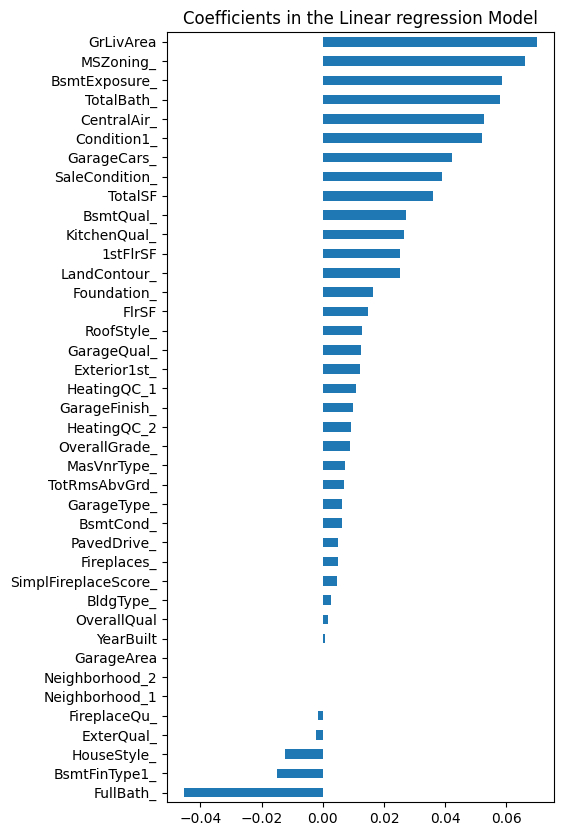

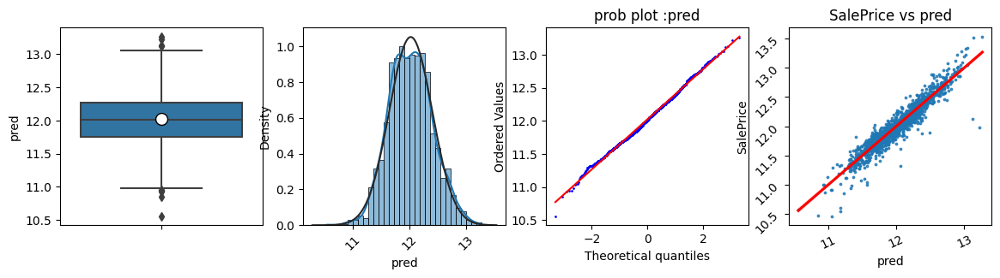

In [21]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

reg = LinearRegression().fit(X, y)
print('R2: %.4f' % reg.score(X, y))
print('R2: %.4f' % r2_score(y, reg.predict(X)))
print('RMSE: %.4f' % math.sqrt(
    mean_squared_error(y, reg.predict(X))))
print('coeff:', reg.coef_)
print('intercept: %.2f' % reg.intercept_)

fig, ax = plt.subplots(1, 1, figsize=(5, 10))
coefs = pd.Series(reg.coef_[0], index=X.columns)
print("Linear regression" + str(sum(coefs != 0)) + " features")
ax = coefs.sort_values().plot(kind="barh")
plt.title("Coefficients in the Linear regression Model")
plt.show()

translog_vis(pd.concat([y, pd.DataFrame(
    reg.predict(X), columns=['pred'])], axis=1), 'pred', 'SalePrice', ln=False, light=True)

In [22]:
compet2 = compet.copy()
compet2.SalePrice = np.exp(reg.predict(Xt))
compet2.to_csv('out_LR.csv', index=False)

## Ridge regression : L2 regularization

In [23]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
# Linear least squares with coef l2 regularization
# penality to the size of the coef
# alpha = 0 -> no penalty
# more robust to colinearity issues (the coefficient estimates then will fluctuate massively,  inflate the variance and standard error of coefficient estimates)
# the major advantage of ridge regression is coefficient shrinkage and reducing model complexity
# works well even in the presence of highly correlated features, as it will include all of them in the model. Still, the coefficients will be distributed among them depending on the correlation.

from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score

# initialisation du classifieur
grid = dict()
grid['alpha'] = [1e-15, 1e-10, 1e-8, 1e-4, 1e-3,
                 1e-2, 1, 5, 10, 20, 30,  40, 1e2, 1e3, 1e4]

scoring = {"R2": "r2", "MSE": "neg_mean_squared_error"}

reg_RLR = GridSearchCV(estimator=Ridge(random_state=0),
                       param_grid=grid,
                       scoring=scoring,
                       n_jobs=-1,
                       cv=KFold(
    n_splits=10, shuffle=True, random_state=0),
    error_score='raise',
    verbose=2,
    refit='MSE')  # pour choisir le score de selection


reg_RLR.fit(X, y.values.flatten())

Fitting 10 folds for each of 15 candidates, totalling 150 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=0, shuffle=True),
             error_score='raise', estimator=Ridge(random_state=0), n_jobs=-1,
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.0001, 0.001, 0.01, 1,
                                   5, 10, 20, 30, 40, 100.0, 1000.0, 10000.0]},
             refit='MSE', scoring={'MSE': 'neg_mean_squared_error', 'R2': 'r2'},
             verbose=2)

{'alpha': 40}
R2: 0.8997
R2: 0.8997
RMSE: 0.1265
coeff: [[ 4.08792120e-02  2.60690158e-02  3.41249349e-02  4.11399170e-02
   2.23550856e-03 -1.18651081e-03  1.22760829e-02  7.48822260e-03
  -3.17690967e-02  2.42972388e-02  7.97311303e-03  2.68995374e-03
  -3.12973329e-03  1.06825864e-02  3.08712754e-02  1.15178419e-02
   7.15171887e-03  5.56627741e-02  2.38081087e-02  3.94180429e-07
   7.94148058e-07  3.99678118e-02  3.35738665e-03 -1.01937909e-02
   1.08868314e-02  1.02197071e-02  5.57001780e-03  1.62353376e-02
   2.57303635e-02  8.80363669e-03  4.62534154e-02 -1.41988689e-02
   7.70496205e-03  3.43097050e-02  8.06438083e-04  6.90585961e-05
   5.14634528e-02  9.19024966e-03  5.94068925e-03  2.53949351e-02]]
intercept: 8.73
Linear regression40 features


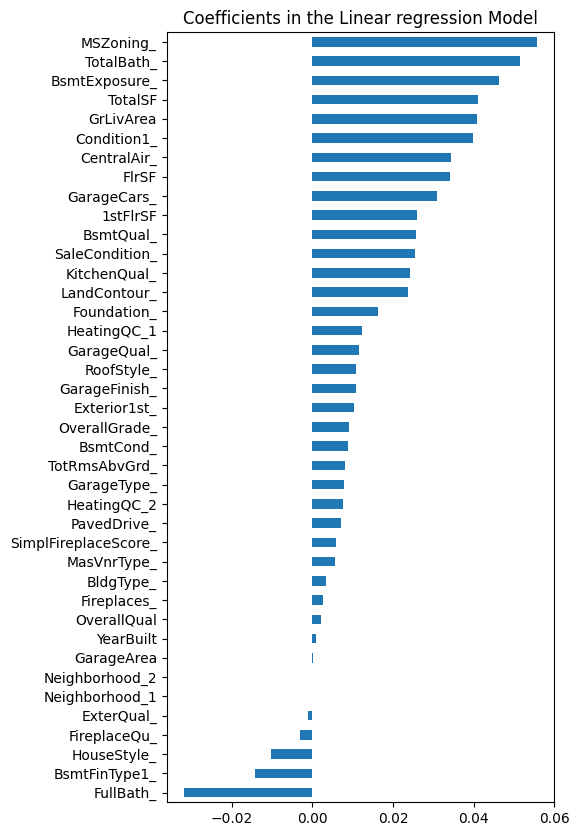

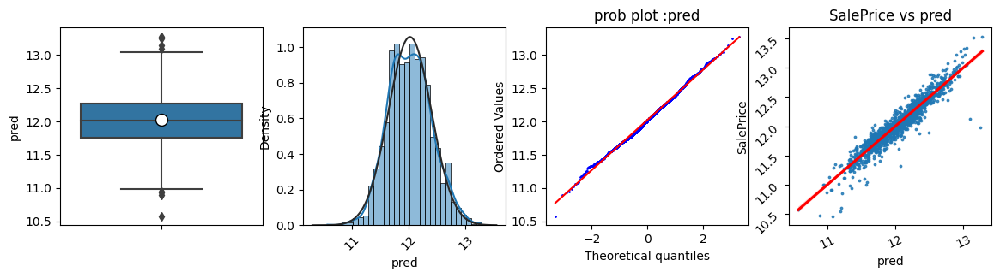

In [24]:
print(reg_RLR.best_params_)

RLR = Ridge(alpha=reg_RLR.best_params_.get('alpha')).fit(X, y)
#RLR = Ridge(alpha=10000).fit(X, y)
print('R2: %.4f' % RLR.score(X, y))
print('R2: %.4f' % r2_score(y, RLR.predict(X)))
print('RMSE: %.4f' % math.sqrt(
    mean_squared_error(y, RLR.predict(X))))
print('coeff:', RLR.coef_)
print('intercept: %.2f' % RLR.intercept_)

fig, ax = plt.subplots(1, 1, figsize=(5, 10))
coefs = pd.Series(RLR.coef_[0], index=X.columns)
print("Linear regression" + str(sum(coefs != 0)) + " features")
ax = coefs.sort_values().plot(kind="barh")
plt.title("Coefficients in the Linear regression Model")
plt.show()

translog_vis(pd.concat([y, pd.DataFrame(
    RLR.predict(X), columns=['pred'])], axis=1), 'pred', 'SalePrice', ln=False, light=True)

In [25]:
Xt = h.loc[h.SalePrice.isnull(), h.columns != 'SalePrice']

compet2 = compet.copy()
compet2.SalePrice = np.exp(reg_RLR.predict(Xt))
compet2.to_csv('out_RLR.csv', index=False)

## Lasso regression : L1 regularization -> features on-off

In [26]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
# https://www.analyticsvidhya.com/blog/2016/01/ridge-lasso-regression-python-complete-tutorial/
# Linear least squares with coef l1 regularization
# tendency to prefer solutions with fewer non-zero coefficients
# alpha = 0 -> no penalty
# more robust to colinearity issues (the coefficient estimates then will fluctuate massively,  inflate the variance and standard error of coefficient estimates)
# some of the coefficients become exactly zero, which is equivalent to the particular feature being excluded from the model.
# It arbitrarily selects any feature among the highly correlated ones and reduces the coefficients of the rest to zero.
# Also, the chosen variable changes randomly with changes in model parameters. This generally doesn’t work that well as compared to ridge regression
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score

# initialisation du classifieur
# {'alpha': 0.0001, 'max_iter': 10000, 'tol': 0.001}
grid = dict()
grid['alpha'] = [0.0001]#[1e-15, 1e-10, 1e-8, 1e-4, 1e-3,1e-2, 1, 5, 10]
grid['tol'] = [1e-3]
grid['max_iter'] = [100000]

scoring = {"R2": "r2", "MSE": "neg_mean_squared_error"}

reg_LLR = GridSearchCV(estimator=Lasso(random_state=0),
                       param_grid=grid,
                       scoring=scoring,
                       n_jobs=-1,
                       cv=KFold(
    n_splits=10, shuffle=True, random_state=0),
    error_score='raise',
    verbose=2,
    refit='MSE')  # pour choisir le score de selection


reg_LLR.fit(X, y.values.flatten())

Fitting 10 folds for each of 1 candidates, totalling 10 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=0, shuffle=True),
             error_score='raise', estimator=Lasso(random_state=0), n_jobs=-1,
             param_grid={'alpha': [0.0001], 'max_iter': [100000],
                         'tol': [0.001]},
             refit='MSE', scoring={'MSE': 'neg_mean_squared_error', 'R2': 'r2'},
             verbose=2)

{'alpha': 0.0001, 'max_iter': 100000, 'tol': 0.001}
R2: 0.9004
R2: 0.9004
RMSE: 0.1260
coeff: [ 6.87065580e-02  2.53930950e-02  1.48601004e-02  3.71974773e-02
  1.25557655e-03 -8.41313970e-04  1.15278047e-02  7.84971731e-03
 -4.39018389e-02  2.58475368e-02  6.91076177e-03  1.22903729e-03
 -2.02932512e-03  9.96995045e-03  4.10934723e-02  1.22447318e-02
  4.80755983e-03  6.54763314e-02  2.48949980e-02  4.11520986e-07
  7.54968777e-07  5.08687942e-02  2.23570974e-03 -1.20070819e-02
  1.22771753e-02  1.18888331e-02  5.98245583e-03  1.61991237e-02
  2.68893187e-02  5.34673257e-03  5.78022378e-02 -1.47701921e-02
  6.34548473e-03  5.14163993e-02  6.66346425e-04  3.84669576e-05
  5.74302131e-02  9.06558080e-03  5.27325955e-03  3.70120442e-02]
intercept: 8.93
Lasso Linear regression40 features


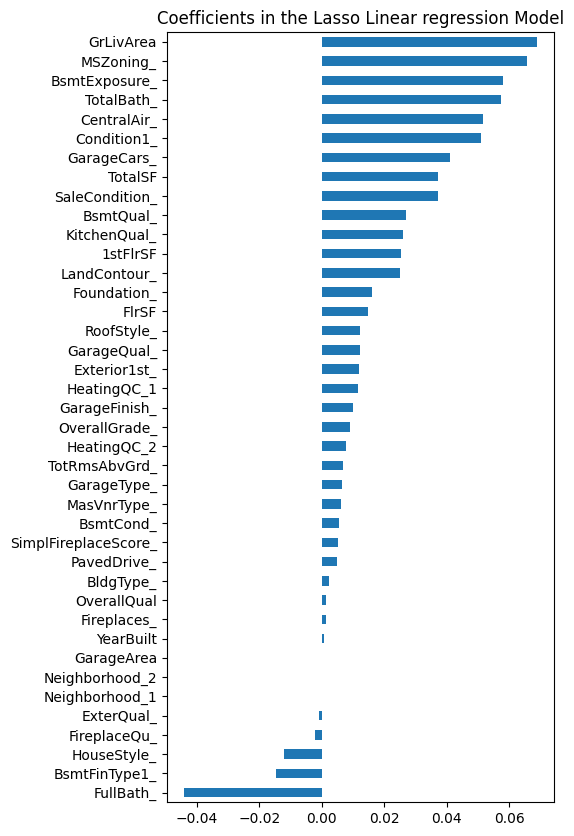

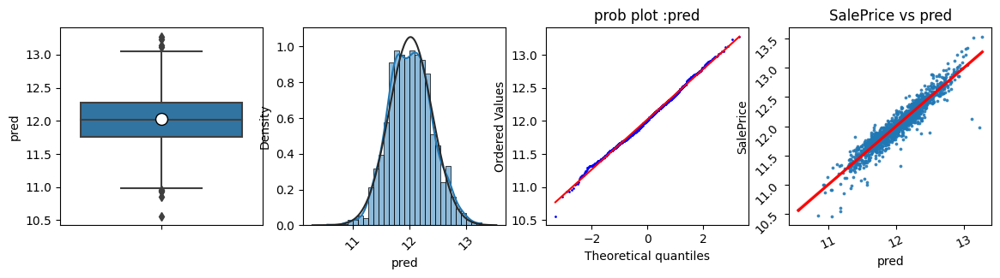

In [27]:
print(reg_LLR.best_params_)

LLR = Lasso(alpha=reg_LLR.best_params_.get('alpha'), tol=1e-3,
            max_iter=10000).fit(X, y)
#LLR = Lasso(alpha=0.1).fit(X, y)
print('R2: %.4f' % LLR.score(X, y))
print('R2: %.4f' % r2_score(y, LLR.predict(X)))
print('RMSE: %.4f' % math.sqrt(
    mean_squared_error(y, LLR.predict(X))))
print('coeff:', LLR.coef_)
print('intercept: %.2f' % LLR.intercept_)

fig, ax = plt.subplots(1, 1, figsize=(5, 10))
coefs = pd.Series(LLR.coef_, index=X.columns)
print("Lasso Linear regression" + str(sum(coefs != 0)) + " features")
ax = coefs.sort_values().plot(kind="barh")
plt.title("Coefficients in the Lasso Linear regression Model")
plt.show()

translog_vis(pd.concat([y, pd.DataFrame(
    LLR.predict(X), columns=['pred'])], axis=1), 'pred', 'SalePrice', ln=False, light=True)

In [28]:
Xt = h.loc[h.SalePrice.isnull(), h.columns != 'SalePrice']


compet2 = compet.copy()
compet2.SalePrice = np.exp(reg_LLR.predict(Xt))
compet2.to_csv('out_LLR.csv', index=False)

## ElasticNet regression : L1 & L2 regularization

In [29]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
# L1 & L2 reg

from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error, r2_score

# initialisation du classifieur
# {'alpha': 0.001, 'l1_ratio': 0.3, 'max_iter': 10000, 'tol': 0.001}
grid = dict()
grid['alpha'] = [1e-3]#[1e-15, 1e-10, 1e-8, 1e-4, 1e-3,1e-2, 1, 5, 1e1, 1e2, 1e3]
grid['l1_ratio'] = [0.3]#[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
grid['tol'] = [1e-3]
grid['max_iter'] = [100000]

scoring = {"R2": "r2", "MSE": "neg_mean_squared_error"}

reg_ELR = GridSearchCV(estimator=ElasticNet(random_state=0),
                       param_grid=grid,
                       scoring=scoring,
                       n_jobs=-1,
                       cv=KFold(
    n_splits=10, shuffle=True, random_state=0),
    error_score='raise',
    verbose=2,
    refit='MSE')  # pour choisir le score de selection


reg_ELR.fit(X, y.values.flatten())

Fitting 10 folds for each of 1 candidates, totalling 10 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=0, shuffle=True),
             error_score='raise', estimator=ElasticNet(random_state=0),
             n_jobs=-1,
             param_grid={'alpha': [0.001], 'l1_ratio': [0.3],
                         'max_iter': [100000], 'tol': [0.001]},
             refit='MSE', scoring={'MSE': 'neg_mean_squared_error', 'R2': 'r2'},
             verbose=2)

{'alpha': 0.001, 'l1_ratio': 0.3, 'max_iter': 100000, 'tol': 0.001}
R2: 0.9003
R2: 0.9003
RMSE: 0.1261
coeff: [ 6.25837844e-02  2.53254436e-02  1.81050166e-02  3.97812250e-02
  7.44771040e-04 -0.00000000e+00  1.28497016e-02  5.27288336e-03
 -4.09742511e-02  2.50749761e-02  6.81904561e-03  0.00000000e+00
 -1.25018028e-03  1.00727856e-02  3.86055441e-02  1.16475127e-02
  4.50560288e-03  6.36740223e-02  2.40311901e-02  4.18874473e-07
  7.52923780e-07  4.83774929e-02  1.43279157e-03 -1.12312836e-02
  1.09304467e-02  1.12004469e-02  3.52437426e-03  1.56867646e-02
  2.64174147e-02  3.73118145e-03  5.59039631e-02 -1.44268861e-02
  6.33397371e-03  4.75981247e-02  7.35443858e-04  4.75606797e-05
  5.61048854e-02  9.17291392e-03  5.31360983e-03  3.33282079e-02]
intercept: 8.84
ElasticNet Linear regression38 features


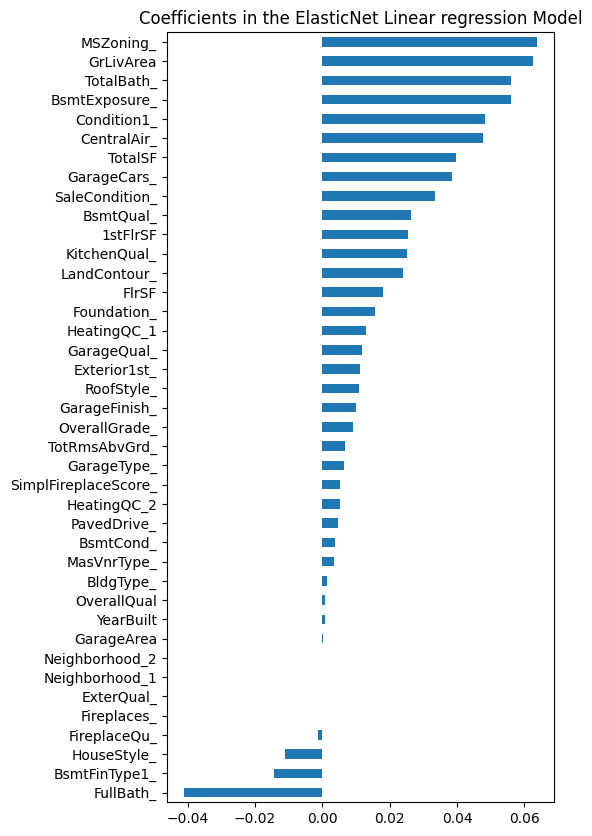

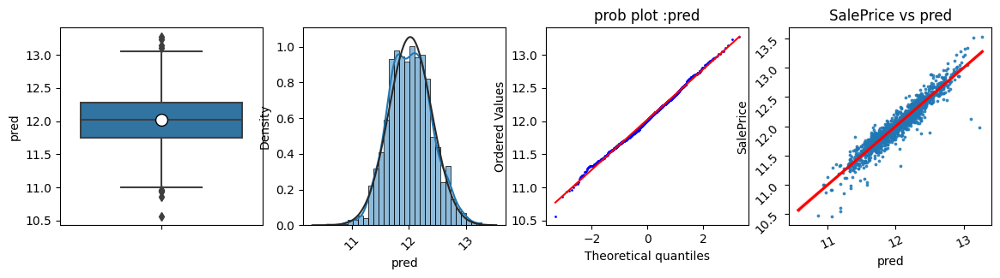

In [30]:
print(reg_ELR.best_params_)

ELR = ElasticNet(alpha=reg_ELR.best_params_.get('alpha'),
                 l1_ratio=reg_ELR.best_params_.get('l1_ratio'), tol=1e-3,
                 max_iter=10000).fit(X, y)
#LLR = Lasso(alpha=0.1).fit(X, y)
print('R2: %.4f' % ELR.score(X, y))
print('R2: %.4f' % r2_score(y, ELR.predict(X)))
print('RMSE: %.4f' % math.sqrt(
    mean_squared_error(y, ELR.predict(X))))
print('coeff:', ELR.coef_)
print('intercept: %.2f' % ELR.intercept_)

fig, ax = plt.subplots(1, 1, figsize=(5, 10))
coefs = pd.Series(ELR.coef_, index=X.columns)
print("ElasticNet Linear regression" + str(sum(coefs != 0)) + " features")
ax = coefs.sort_values().plot(kind="barh")
plt.title("Coefficients in the ElasticNet Linear regression Model")
plt.show()

translog_vis(pd.concat([y, pd.DataFrame(
    ELR.predict(X), columns=['pred'])], axis=1), 'pred', 'SalePrice', ln=False, light=True)

In [31]:
Xt = h.loc[h.SalePrice.isnull(), h.columns != 'SalePrice']


compet2 = compet.copy()
compet2.SalePrice = np.exp(reg_ELR.predict(Xt))
compet2.to_csv('out_ELR.csv', index=False)

## Bagging , random forest regression 

In [32]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor  # n accepte pas les NAN
from sklearn.metrics import mean_squared_error

# initialisation du classifieur
# {'max_depth': 7, 'max_features': 7, 'min_samples_leaf': 3, 'n_estimators': 1200}
grid = dict()
grid['n_estimators'] = [1200]#[500, 600, 700, 800, 900, 1000, 1100, 1200]
grid['max_features'] = [7] #[2, 3, 4, 5, 6, 7, 'sqrt']
grid['max_depth'] = [7] #[3, 5, 6, 7]
grid['min_samples_leaf'] = [3]

scoring = {"R2": "r2", "MSE": "neg_mean_squared_error"}

reg_RF = GridSearchCV(estimator=RandomForestRegressor(random_state=0),
                      param_grid=grid,
                      scoring=scoring,
                      n_jobs=-1,
                      cv=KFold(
    n_splits=10, shuffle=True, random_state=0),
    error_score='raise',
    verbose=2,
    refit='R2')  # pour choisir le score de selection


reg_RF.fit(X, y.values.flatten())

Fitting 10 folds for each of 1 candidates, totalling 10 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=0, shuffle=True),
             error_score='raise',
             estimator=RandomForestRegressor(random_state=0), n_jobs=-1,
             param_grid={'max_depth': [7], 'max_features': [7],
                         'min_samples_leaf': [3], 'n_estimators': [1200]},
             refit='R2', scoring={'MSE': 'neg_mean_squared_error', 'R2': 'r2'},
             verbose=2)

In [33]:
print(reg_RF.best_params_)
print('R2: %.4f' % r2_score(y, reg_RF.predict(X)))
print('MSE: %.4f' %
      mean_squared_error(y, reg_RF.predict(X)))
print('RMSE: %.4f' % math.sqrt(
    mean_squared_error(y, reg_RF.predict(X))))

{'max_depth': 7, 'max_features': 7, 'min_samples_leaf': 3, 'n_estimators': 1200}
R2: 0.9301
MSE: 0.0111
RMSE: 0.1056


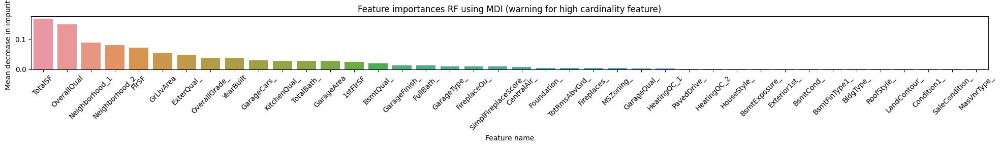

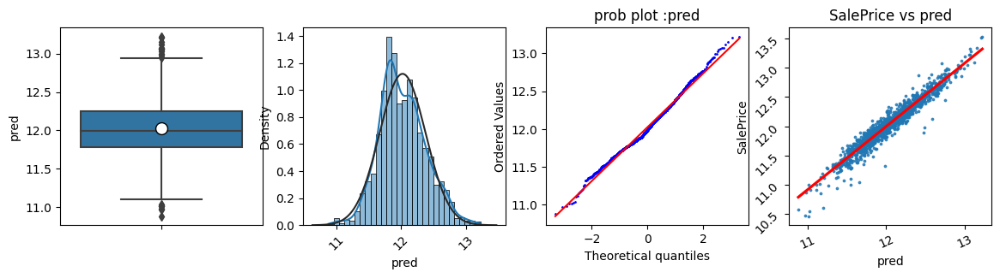

In [34]:
fimp = pd.Series(
    reg_RF.best_estimator_.feature_importances_, index=reg_RF.best_estimator_.feature_names_in_).sort_values(ascending=False)
fimp = fimp.reset_index()
fimp.columns = ['Feature name', 'Feature importance']

fig, ax = plt.subplots(1, 1, figsize=(20, 3))
sns.barplot(x='Feature name', y='Feature importance',
            data=fimp, ax=ax)
ax.set_title(
    "Feature importances RF using MDI (warning for high cardinality feature)")
ax.set_ylabel("Mean decrease in impurity")
ax.tick_params(axis='x', rotation=45)
fig.tight_layout()

translog_vis(pd.concat([y, pd.DataFrame(
    reg_RF.predict(X), columns=['pred'])], axis=1), 'pred', 'SalePrice', ln=False, light=True)

In [35]:
compet2 = compet.copy()
compet2.SalePrice = np.exp(reg_RF.predict(Xt))
compet2.to_csv('out_RF.csv', index=False)

## boosting , gradient boosting regression 

In [36]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor

#{'learning_rate': 0.02, 'max_features': 'sqrt', 'max_leaf_nodes': 7, 'min_samples_leaf': 3, 'n_estimators': 1500, 'subsample': 0.7}
grid = dict()
grid['n_estimators'] = [1500] #[1300, 1400, 1500]
grid['learning_rate'] = [0.02]
grid['max_leaf_nodes'] = [3] #[5, 6, 7]
grid['subsample'] = [0.7] #[0.7, 0.6]
grid['min_samples_leaf'] = [3]
grid['max_features'] = ['sqrt'] #['sqrt', None]

scoring = {"R2": "r2", "MSE": "neg_mean_squared_error"}

reg_GB = GridSearchCV(estimator=GradientBoostingRegressor(random_state=0),
                      param_grid=grid,
                      scoring=scoring,
                      n_jobs=-1,
                      cv=KFold(
    n_splits=10, shuffle=True, random_state=0),
    error_score='raise',
    verbose=2,
    refit='R2')

reg_GB.fit(X, y.values.flatten())

Fitting 10 folds for each of 1 candidates, totalling 10 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=0, shuffle=True),
             error_score='raise',
             estimator=GradientBoostingRegressor(random_state=0), n_jobs=-1,
             param_grid={'learning_rate': [0.02], 'max_features': ['sqrt'],
                         'max_leaf_nodes': [3], 'min_samples_leaf': [3],
                         'n_estimators': [1500], 'subsample': [0.7]},
             refit='R2', scoring={'MSE': 'neg_mean_squared_error', 'R2': 'r2'},
             verbose=2)

In [37]:
print(reg_GB.best_params_)
print('R2: %.4f' % r2_score(y, reg_GB.predict(X)))
print('MSE: %.4f' %
      mean_squared_error(y, reg_GB.predict(X)))
print('RMSE: %.4f' % math.sqrt(
    mean_squared_error(y, reg_GB.predict(X))))

{'learning_rate': 0.02, 'max_features': 'sqrt', 'max_leaf_nodes': 3, 'min_samples_leaf': 3, 'n_estimators': 1500, 'subsample': 0.7}
R2: 0.9376
MSE: 0.0100
RMSE: 0.0998


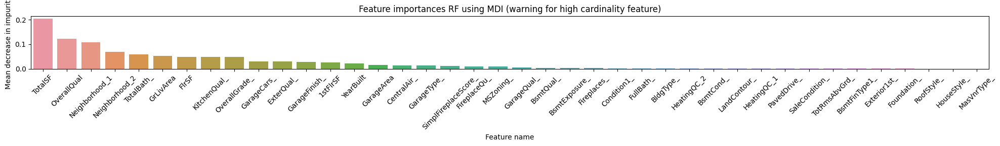

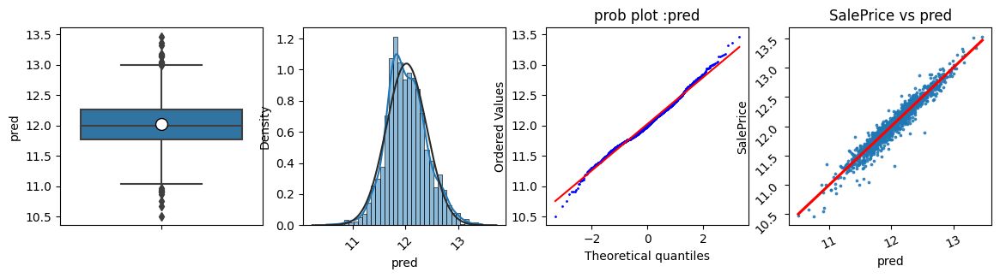

In [38]:
fimp = pd.Series(
    reg_GB.best_estimator_.feature_importances_, index=reg_GB.best_estimator_.feature_names_in_).sort_values(ascending=False)
fimp = fimp.reset_index()
fimp.columns = ['Feature name', 'Feature importance']

fig, ax = plt.subplots(1, 1, figsize=(20, 3))
sns.barplot(x='Feature name', y='Feature importance',
            data=fimp, ax=ax)
ax.set_title(
    "Feature importances RF using MDI (warning for high cardinality feature)")
ax.set_ylabel("Mean decrease in impurity")
ax.tick_params(axis='x', rotation=45)
fig.tight_layout()

translog_vis(pd.concat([y, pd.DataFrame(
    reg_GB.predict(X), columns=['pred'])], axis=1), 'pred', 'SalePrice', ln=False, light=True)

In [39]:
compet2 = compet.copy()
compet2.SalePrice = np.exp(reg_GB.predict(Xt))
compet2.to_csv('out_GB.csv', index=False)

## boosting , x gradient boosting regression 

In [40]:
from sklearn.model_selection import RepeatedStratifiedKFold, KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
import time
#import cupy as cp  # to put df on gpu style
# https://towardsdatascience.com/do-you-use-xgboost-heres-how-to-make-it-200x-faster-16cb6039a16e
# cupy : https://github.com/dmlc/xgboost/issues/9791


#{'alpha': 0.1, 'colsample_bytree': 0.5, 'eta': 0.1, 'lambda': 20, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.5}
grid = dict()
# number of trees between 100 to 1000 : large -> better perf but overfit & time
grid['n_estimators'] = [500] #[100, 500, 1000]
# max depth of tree : large overfit - small underfit
grid['max_depth'] = [3] #[3, 7]
grid['eta'] = [0.1]  # learning rate
grid['subsample'] = [0.5]
# controls the fraction of features used for each tree : large fraction  overfit
grid['colsample_bytree'] = [0.5]
grid['lambda'] = [20]  # L2 regularization term on weights helps to reduce overfitting by adding a penalty term to the loss function: large reduce overfitting
# L1 regularization term on weights helps to reduce overfitting by adding a penalty term to the loss function: large reduce overfitting / Used for high dimensionality
grid['alpha'] = [0.1]
#grid['max_features'] = ['sqrt', None]

scoring = {"R2": "r2", "MSE": "neg_mean_squared_error"}

reg_XGB = GridSearchCV(estimator=xgb.XGBRegressor(random_state=0, tree_method="hist"),#, device="cuda"),
                       param_grid=grid,
                       scoring=scoring,
                       n_jobs=-1,
                       cv=KFold(
    n_splits=10, shuffle=True, random_state=0),
    error_score='raise',
    verbose=2,
    refit='R2')

#Xg = cp.array(X)
#yg = cp.array(y)
start = time.time()
reg_XGB.fit(X, y.values.flatten())
print(time.time() - start)

Fitting 10 folds for each of 1 candidates, totalling 10 fits
2.3420796394348145


In [41]:
from sklearn.metrics import mean_squared_error, r2_score
print(reg_XGB.best_params_)
print('R2: %.4f' % r2_score(y, reg_XGB.predict(X)))
print('MSE: %.4f' %
      mean_squared_error(y, reg_XGB.predict(X)))
print('RMSE: %.4f' % math.sqrt(
    mean_squared_error(y, reg_XGB.predict(X))))

{'alpha': 0.1, 'colsample_bytree': 0.5, 'eta': 0.1, 'lambda': 20, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.5}
R2: 0.9615
MSE: 0.0061
RMSE: 0.0783


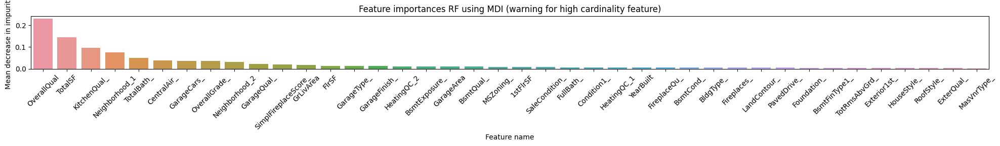

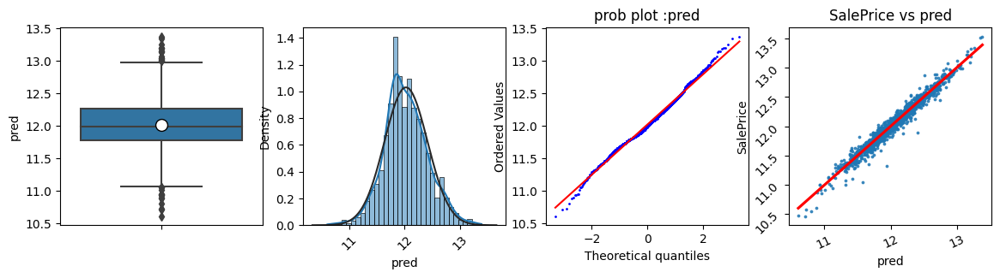

In [42]:
fimp = pd.Series(
    reg_XGB.best_estimator_.feature_importances_, index=reg_XGB.best_estimator_.feature_names_in_).sort_values(ascending=False)
fimp = fimp.reset_index()
fimp.columns = ['Feature name', 'Feature importance']

fig, ax = plt.subplots(1, 1, figsize=(20, 3))
sns.barplot(x='Feature name', y='Feature importance',
            data=fimp, ax=ax)
ax.set_title(
    "Feature importances RF using MDI (warning for high cardinality feature)")
ax.set_ylabel("Mean decrease in impurity")
ax.tick_params(axis='x', rotation=45)
fig.tight_layout()

translog_vis(pd.concat([y, pd.DataFrame(
    reg_XGB.predict(X), columns=['pred'])], axis=1), 'pred', 'SalePrice', ln=False, light=True)

In [43]:
compet2 = compet.copy()
compet2.SalePrice = np.exp(reg_XGB.predict(Xt))#cp.array(Xt)))
compet2.to_csv('out_XGB.csv', index=False)

## Support vector machine , SV regression 

In [44]:
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
import numpy as np

scoring = {"R2": "r2", "MSE": "neg_mean_squared_error"}

grid = dict()
grid['epsilon'] = [1e-2, 1e-1, 1]
# L2 reg
# small C => penalty for misclassified points is low  => wider margin with more errors allowed
# large C=> small margin => overfit
grid['C'] = [10, 30]  # [0.1, 1, 10, 30]
# hyperdim
grid['kernel'] = ['rbf']  # ['linear', 'rbf', 'poly']

reg_SVR = Pipeline(steps=[('RS', RobustScaler()), ('GS', GridSearchCV(estimator=SVR(),
                                                                      param_grid=grid,
                                                                      scoring=scoring,
                                                                      n_jobs=-1,
                                                                      cv=KFold(n_splits=10, shuffle=True, random_state=0), error_score='raise', verbose=2, refit='R2'))]
                   )
reg_SVR.fit(X, y.values.flatten())

Fitting 10 folds for each of 6 candidates, totalling 60 fits


Pipeline(steps=[('RS', RobustScaler()),
                ('GS',
                 GridSearchCV(cv=KFold(n_splits=10, random_state=0, shuffle=True),
                              error_score='raise', estimator=SVR(), n_jobs=-1,
                              param_grid={'C': [10, 30],
                                          'epsilon': [0.01, 0.1, 1],
                                          'kernel': ['rbf']},
                              refit='R2',
                              scoring={'MSE': 'neg_mean_squared_error',
                                       'R2': 'r2'},
                              verbose=2))])

In [45]:
print(reg_SVR['GS'].best_params_)
print('R2: %.4f' % r2_score(y, reg_SVR.predict(X)))
print('MSE: %.4f' %
      mean_squared_error(y, reg_SVR.predict(X)))
print('RMSE: %.4f' % math.sqrt(
    mean_squared_error(y, reg_SVR.predict(X))))

{'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
R2: 0.9659
MSE: 0.0054
RMSE: 0.0738


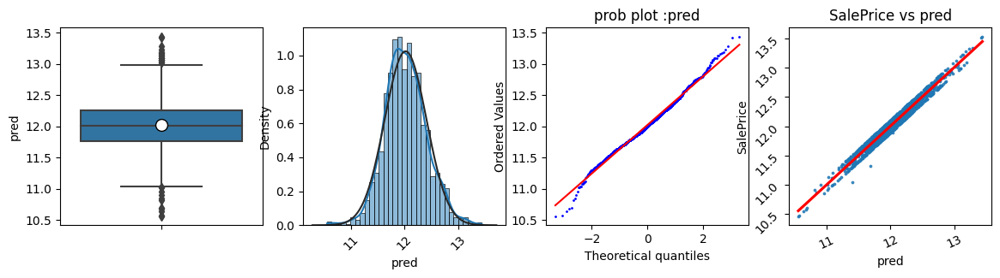

In [46]:
translog_vis(pd.concat([y, pd.DataFrame(
    reg_SVR.predict(X), columns=['pred'])], axis=1), 'pred', 'SalePrice', ln=False, light=True)

In [47]:
compet2 = compet.copy()
compet2.SalePrice = np.exp(reg_SVR.predict(Xt))
compet2.to_csv('out_SVR.csv', index=False)

## Weigted voting

In [48]:
# blended model / voting
compet2 = compet.copy()
compet2.SalePrice = (0.25*np.exp(reg.predict(Xt)).flatten()+0.25*np.exp(reg_RLR.predict(Xt))+0.25*np.exp(reg_LLR.predict(
    Xt))+0.25*np.exp(reg_ELR.predict(Xt))+0.75*np.exp(reg_RF.predict(Xt))+1.25*np.exp(reg_GB.predict(Xt)))/3
compet2.to_csv('out_blended.csv', index=False)

In [49]:
# blended model / voting
compet2 = compet.copy()
compet2.SalePrice = (0.25*np.exp(reg.predict(Xt)).flatten()+0.25*np.exp(reg_RLR.predict(Xt))+0.25*np.exp(reg_LLR.predict(
    Xt))+0.25*np.exp(reg_ELR.predict(Xt))+0.5*np.exp(reg_RF.predict(Xt))+1.5*np.exp(reg_GB.predict(Xt)))/3
compet2.to_csv('out_blended2.csv', index=False)

In [50]:
# blended model / voting
compet2 = compet.copy()
compet2.SalePrice = (0.25*np.exp(reg.predict(Xt)).flatten()+0.25*np.exp(reg_RLR.predict(Xt))+0.25*np.exp(reg_LLR.predict(
    Xt))+0.25*np.exp(reg_ELR.predict(Xt))+0.4*np.exp(reg_RF.predict(Xt))+1.6*np.exp(reg_GB.predict(Xt)))/3
compet2.to_csv('out_blended3.csv', index=False)

In [51]:
# blended model / voting
compet2 = compet.copy()
compet2.SalePrice = (0.25*np.exp(reg.predict(Xt)).flatten()+0.25*np.exp(reg_RLR.predict(Xt))+0.25*np.exp(reg_LLR.predict(
    Xt))+0.25*np.exp(reg_ELR.predict(Xt))+0.4*np.exp(reg_RF.predict(Xt))+1.6*np.exp(reg_GB.predict(Xt))+1*np.exp(reg_XGB.predict(Xt)))/4
compet2.to_csv('out_blended4.csv', index=False)

In [52]:
# blended model / voting
compet2 = compet.copy()
compet2.SalePrice = (0.25*np.exp(reg.predict(Xt)).flatten()+0.25*np.exp(reg_RLR.predict(Xt))+0.25*np.exp(reg_LLR.predict(
    Xt))+0.25*np.exp(reg_ELR.predict(Xt))+0.4*np.exp(reg_RF.predict(Xt))+1.6*np.exp(reg_GB.predict(Xt))+0.8*np.exp(reg_XGB.predict(Xt))+0.9*np.exp(reg_SVR.predict(Xt)))/4.7
compet2.to_csv('out_blended5.csv', index=False)

## stacking

In [53]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression

estimators = [('LinReg', reg),
              ('RidReg', reg_RLR.best_estimator_),
              ('LasReg', reg_LLR.best_estimator_),
              ('ElaReg', reg_ELR.best_estimator_),
              ('RanFor', reg_RF.best_estimator_),
              ('GraBoo', reg_GB.best_estimator_),
              ('XGraBoo', reg_XGB.best_estimator_),
              ('SVR',reg_SVR['GS'].best_estimator_)]


reg_stack = StackingRegressor(
    estimators=estimators, final_estimator=LinearRegression())

reg_stack.fit(X, y.values.flatten())

print('R2: %.4f' % reg_stack.score(X, y))
print('R2: %.4f' % r2_score(y, reg_stack.predict(X)))
print('RMSE: %.4f' % math.sqrt(
    mean_squared_error(y, reg_stack.predict(X))))
print('coeff:', reg.coef_)


compet2 = compet.copy()
compet2.SalePrice = np.exp(reg_stack.predict(Xt))
compet2.to_csv('out_Stack.csv', index=False)

R2: 0.9485
R2: 0.9485
RMSE: 0.0907
coeff: [[ 6.99257785e-02  2.53524692e-02  1.48526126e-02  3.61190920e-02
   1.65534959e-03 -2.16345230e-03  1.09146454e-02  9.21556182e-03
  -4.51839726e-02  2.65339882e-02  7.00592041e-03  4.93625900e-03
  -1.64227627e-03  9.97012825e-03  4.21162871e-02  1.24963391e-02
   5.01527919e-03  6.61865327e-02  2.53374713e-02  4.15772430e-07
   7.50511219e-07  5.19207061e-02  2.67087384e-03 -1.24193743e-02
   1.29668763e-02  1.22113483e-02  7.36578879e-03  1.64860583e-02
   2.71527042e-02  6.17618220e-03  5.84824342e-02 -1.49347598e-02
   6.30793516e-03  5.27491738e-02  6.32892824e-04  3.45447469e-05
   5.79413734e-02  9.01329663e-03  4.55690117e-03  3.88689398e-02]]


## pickle

In [54]:
import pickle

filename1 = "reg.pickle"
filename2 = "reg_RLR.pickle"
filename3 = "reg_LLR.pickle"
filename4 = "reg_ELR.pickle"
filename5 = "reg_RF.pickle"
filename6 = "reg_GB.pickle"
filename7 = "reg_XGB.pickle"
filename8 = "reg_SVR.pickle"

# save model
#reg = pickle.load(open(filename1, "rb"))
#reg_RLR = pickle.load(open(filename2, "rb"))
#reg_LLR = pickle.load(open(filename3, "rb"))
#reg_ELR = pickle.load(open(filename4, "rb"))
#reg_RF = pickle.load(open(filename5, "rb"))
#reg_GB = pickle.load(open(filename6, "rb"))
#reg_XGB = pickle.load(open(filename7, "rb"))
#reg_SVR = pickle.load(open(filename8, "rb"))

In [55]:
import pickle

filename1 = "reg.pickle"
filename2 = "reg_RLR.pickle"
filename3 = "reg_LLR.pickle"
filename4 = "reg_ELR.pickle"
filename5 = "reg_RF.pickle"
filename6 = "reg_GB.pickle"
filename7 = "reg_XGB.pickle"
filename8 = "reg_SVR.pickle"

# save model
#pickle.dump(reg, open(filename1, "wb"))
#pickle.dump(reg_RLR, open(filename2, "wb"))
#pickle.dump(reg_LLR, open(filename3, "wb"))
#pickle.dump(reg_ELR, open(filename4, "wb"))
#pickle.dump(reg_RF, open(filename5, "wb"))
#pickle.dump(reg_GB, open(filename6, "wb"))
#pickle.dump(reg_XGB, open(filename7, "wb"))
#pickle.dump(reg_SVR, open(filename8, "wb"))

# SANDBANK

exemple vandermonde


array([[1, 1, 1],
       [1, 2, 4],
       [1, 3, 9]])

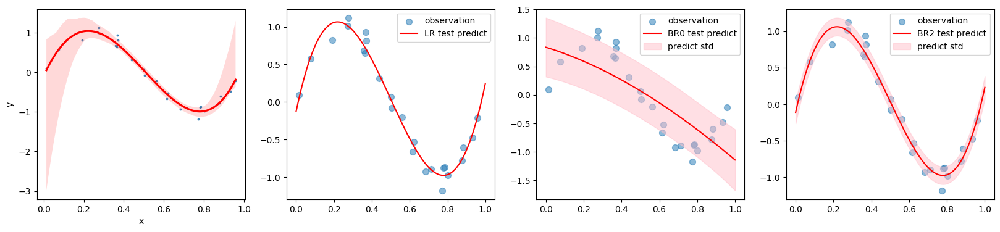

In [56]:
import numpy as np
from sklearn.linear_model import BayesianRidge, LinearRegression


def func(x):
    return np.sin(2 * np.pi * x)


# vecteur aletoire uniforme de25
size = 25
rng = np.random.RandomState(1234)
x_train = rng.uniform(0.0, 1.0, size)
#x_train = np.sort(x_train)

# sinusoidale bruitée (centree de std 0.1) non trié entre -1 et 1
y_train = func(x_train) + rng.normal(scale=0.1, size=size)
# vecteur croissant de 100val entre 0 et 1: juste fait pour avoir plus de points quand on tracer la ligne de regression sachant qu elle n est pas droite, c est mieux
x_test = np.linspace(0.0, 1.0, 100)

# matrice vandermonde = matrice qui va donner pour la colonne n , le array à la puissance n
# 4 veut dire puissance 0,1,2,3,
X_train = np.vander(x_train, 4, increasing=True)
X_test = np.vander(x_test, 4, increasing=True)

# exemple
x = np.array([1, 2, 3])
N = 3
print('exemple vandermonde')
display(np.vander(x, N, increasing=True))

########
# bayasian reg
# def alpha_init = 1/Var(y) (precision noise)
# def lambda init = 1 (precision weight)
# first try with def parameter: too much biais, low variance => decrease lambda to increase weight precision
breg0 = BayesianRidge(tol=1e-6, fit_intercept=False, compute_score=True)
breg1 = BayesianRidge(tol=1e-6, fit_intercept=False,
                      compute_score=True, lambda_init=1e-1)
breg2 = BayesianRidge(tol=1e-6, fit_intercept=False,
                      compute_score=True, lambda_init=1e-2)
breg3 = BayesianRidge(tol=1e-6, fit_intercept=False,
                      compute_score=True, lambda_init=1e-3)
lreg = LinearRegression()

lreg.fit(X_train, y_train)
breg0.fit(X_train, y_train)
breg1.fit(X_train, y_train)
breg2.fit(X_train, y_train)
breg3.fit(X_train, y_train)

df = pd.concat([pd.DataFrame(x_train, columns=['x']),
               pd.DataFrame(y_train, columns=['y'])], axis=1)
fig, ax = plt.subplots(1, 4, figsize=(20, 4))
# attention a l intercept
sns.regplot(data=df,
            y='y', x='x', ax=ax[0],  order=4, line_kws={"color": "red"}, ci=99, scatter_kws={'s': 3})


ax[1].scatter(x_train, y_train, s=50, alpha=0.5, label="observation")
ax[1].plot(x_test, lreg.predict(X_test), color="red", label="LR test predict")
#ax[1].plot(x_train, lreg.predict(X_train),color="blue", label="LR train predict")
ax[1].legend()


ax[2].scatter(x_train, y_train, s=50, alpha=0.5, label="observation")
ax[2].plot(x_test, breg0.predict(X_test, return_std=True)
           [0], color="red", label="BR0 test predict")
ax[2].fill_between(
    x_test, breg0.predict(X_test, return_std=True)
    [0] - breg0.predict(X_test, return_std=True)
    [1], breg0.predict(X_test, return_std=True)
    [0] + breg0.predict(X_test, return_std=True)
    [1], color="pink", alpha=0.5, label="predict std"
)
ax[2].legend()

ax[3].scatter(x_train, y_train, s=50, alpha=0.5, label="observation")
ax[3].plot(x_test, breg2.predict(X_test, return_std=True)
           [0], color="red", label="BR2 test predict")
ax[3].fill_between(
    x_test, breg2.predict(X_test, return_std=True)
    [0] - breg2.predict(X_test, return_std=True)
    [1], breg2.predict(X_test, return_std=True)
    [0] + breg2.predict(X_test, return_std=True)
    [1], color="pink", alpha=0.5, label="predict std"
)
ax[3].legend()